Import original Data Files into DataFrames

In [5]:
# Importing Data Files
import pandas as pd
products_df = pd.read_csv('/content/products.tsv', sep='\t', header=0)
reviews_df = pd.read_csv('/content/reviews.tsv', sep='\t', header=0)


In [6]:
# Data Cleaning
reviews_df.loc[reviews_df['id']=='46952c82-d750-41c5-b8f2-92579bb8039c','languageCode'] = 'ru-RU'
reviews_df.loc[reviews_df['id']=='46952c82-d750-41c5-b8f2-92579bb8039c','languageCode.1'] = 'ru-RU'
reviews_df.loc[reviews_df['id']=='46952c82-d750-41c5-b8f2-92579bb8039c','translation.reviewText'] = "The mask, in principle, is cool. Made of pleasant natural fabric, thin. But!!! you need to know that after the first wash it does not significantly decrease in size. Suitable for a child or a girl with a small face. Therefore, for a small face - 5+++! For a standard adult - 4 not because of quality, but because of size"

reviews_df = reviews_df.drop_duplicates(inplace=False, ignore_index=False)

Functions to separate emoji from text


In [7]:
!pip install emoji
import emoji

def extract_emojis(s):
  return ''.join(c for c in s if c in emoji.EMOJI_DATA)

def text_minus_emoji(s):
  return ' '.join(c for c in s if c not in emoji.EMOJI_DATA)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Function to get language given text

In [8]:
# !pip install pycld3

# import cld3

# def getLanguage(text):
#   return cld3.get_language(text)[0]

Sentiment Analysis Function

In [9]:
# Sentiment Analysis Function
from textblob import TextBlob
def getSubjectivity(text):
  return TextBlob(text).sentiment.subjectivity
  
def getPolarity(text):
  return TextBlob(text).sentiment.polarity

def getAnalysis(score):
  if score < 0:
    return 'Negative'
  elif score == 0:
    return 'Neutral'
  else:
    return 'Positive'

def getPOS(text):
  return TextBlob(text).tags



WordCloud Function

In [10]:
## Wordcloud Function

## Word Cloud of Reviews for each of the 26 products

# Python program to generate WordCloud
 
# importing all necessary modules
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
import pandas as pd

def plot_wordcloud(df):
  comment_words = ''
  stopwords = set(STOPWORDS)
  stopwords.update(['mask','good','daughter','grandson','face','masks','always','yet'])
  # iterate through the csv file
  for val in df.EnglishReview:
      
      # typecaste each val to string
      val = str(val)
  
      # split the value
      tokens = val.split()
      
      # Converts each token into lowercase
      for i in range(len(tokens)):
          tokens[i] = tokens[i].lower()
      
      comment_words += " ".join(tokens)+" "
  
  wordcloud = WordCloud(width = 800, height = 800,
                  background_color ='white',
                  stopwords = stopwords,
                  min_font_size = 10).generate(comment_words)
  
  # plot the WordCloud image                      
  # plt.figure(figsize = (2, 2), facecolor = None)
  plt.imshow(wordcloud)
  # plt.axis("off")
  # plt.tight_layout(pad = 0)
  # plt.show()

Translation Function

In [11]:
!pip install translate



Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [12]:
pd.set_option('max_colwidth', None)
# print(products_df[['product_name']].to_string())
products_df[['product_id','product_name']]

,product_id,product_name
0,103205,"Hwipure, Disposable KF94 ( N95 / KN95/ FFP2 ) Mask, 1 Mask"
1,101774,"HIGUARD, Disposable KF94 ( N95 / KN95/ FFP2 ) Mask, 1 Mask"
2,101955,"SunJoy, KN95, Professional Protective Disposable Face Mask, 10 Pack"
3,103838,"Lozperi, Copper Mask, Adult, Black, 1 Mask"
4,102734,"Zidian, Disposable Protective Mask, 50 Pack"
5,100837,"La Hauteur, Disposable KF94 ( N95 / KN95/ FFP2 ) Mask, 1 Mask"
6,100840,"YJ Corporation, Disposable KF94 ( N95 / KN95/ FFP2 ) Mask, for Kids, 1 Mask"
7,103204,"Hwipure, Disposable KF94 ( N95 / KN95/ FFP2 ) Mask, 25 Masks"
8,103840,"Lozperi, Copper Mask, Adult, Gray, 1 Mask"
9,103743,"Puritas, 10 Days Mask, Large, 3 Pack"


Find Unit Price of Masks and add a Count column

<ipython-input-13-8f37878f976f>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  corr_df.rename(columns={'score': 'Review Score', 'ratingValue': 'Rating', 'imagesCount': 'Number of Images in Review', 'helpfulYes': 'Rating Positive Vote','helpfulNo': 'Rating Negative Vote','abuseCount': 'No. of times Abuse reported','profileInfo.ugcSummary.answerCount': 'No. of Answers by Reviewer', 'profileInfo.ugcSummary.reviewCount': 'No. of Reviews by Reviewer',}, inplace=True)


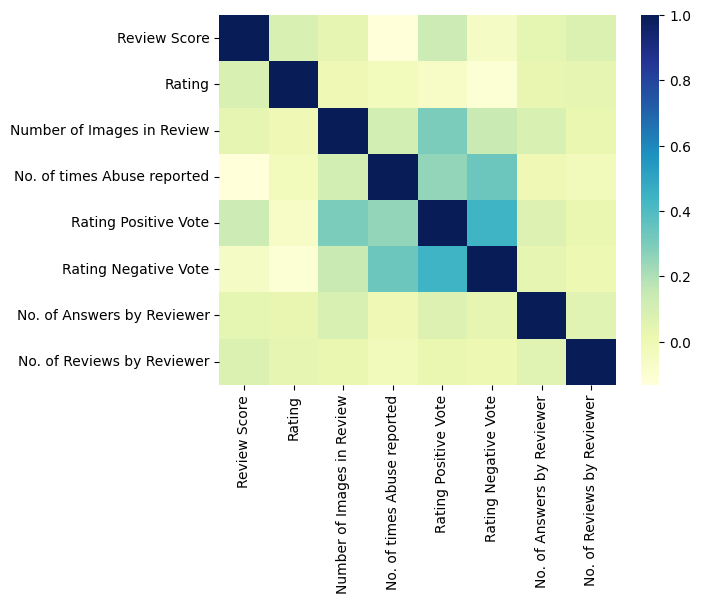

In [13]:
# import modules
import matplotlib.pyplot as mp
import pandas as pd
import seaborn as sb
# Correlation between numbers in reviews
corr_df = reviews_df[['score','ratingValue','imagesCount','abuseCount','helpfulYes','helpfulNo','profileInfo.ugcSummary.answerCount','profileInfo.ugcSummary.reviewCount']]
# reviews_df.info()
# print(corr_df.corr())
corr_df.rename(columns={'score': 'Review Score', 'ratingValue': 'Rating', 'imagesCount': 'Number of Images in Review', 'helpfulYes': 'Rating Positive Vote','helpfulNo': 'Rating Negative Vote','abuseCount': 'No. of times Abuse reported','profileInfo.ugcSummary.answerCount': 'No. of Answers by Reviewer', 'profileInfo.ugcSummary.reviewCount': 'No. of Reviews by Reviewer',}, inplace=True)

# plotting correlation heatmap
dataplot = sb.heatmap(corr_df.corr(), cmap="YlGnBu", annot=False)
  
# displaying heatmap
mp.show()

In [14]:
def get_number(text):
  return int(text.split()[-2])
products_df['Number'] = products_df['product_name'].apply(get_number)

def get_type(text):
  if 'disposable' in text.lower():
    return 'disposable'
  else:
    return 'reusable'
products_df['Type'] = products_df['product_name'].apply(get_type)

def get_brand(text):
  return text.split(',')[0]
products_df['Brand'] = products_df['product_name'].apply(get_brand)

def get_size(text):
  sizes=['small','medium','large','s-m','kids','adult']
  text=''.join(e for e in text if e.isalnum() or e==' ' or e=='-')
  text = text.lower().split()
  if 'small' in text:
    return 'small'
  elif 'medium' in text:
    return 'medium'
  elif 's-m' in text:
    return 'small'
  elif 'large' in text:
    return 'large'
  elif 'adult' in text:
    return 'adult'
  elif 'kids' in text:
    return 'kids'
  else:
    return 'free size'

products_df['Size'] = products_df['product_name'].apply(get_size)

def get_unit_price(number,price):
  return round(price/number,2)
products_df['UnitPrice'] = products_df.apply(lambda x: get_unit_price(x.Number, x.product_price), axis=1)
print(products_df[['product_id','product_name','Type','Size','Number','UnitPrice','product_price','Brand']])

    product_id  \
0       103205   
1       101774   
2       101955   
3       103838   
4       102734   
5       100837   
6       100840   
7       103204   
8       103840   
9       103743   
10      102522   
11      103839   
12      104023   
13      101692   
14      100839   
15      100237   
16      103841   
17       99830   
18      104022   
19       99829   
20      103842   
21      102455   
22      101691   
23      100541   
24      100099   
25      100234   
26      101029   

                                                                   product_name  \
0                    Hwipure, Disposable KF94 ( N95 / KN95/ FFP2 ) Mask, 1 Mask   
1                    HIGUARD, Disposable KF94 ( N95 / KN95/ FFP2 ) Mask, 1 Mask   
2           SunJoy, KN95, Professional Protective Disposable Face Mask, 10 Pack   
3                                    Lozperi, Copper Mask, Adult, Black, 1 Mask   
4                                   Zidian, Disposable Protective Mask, 50 Pack 

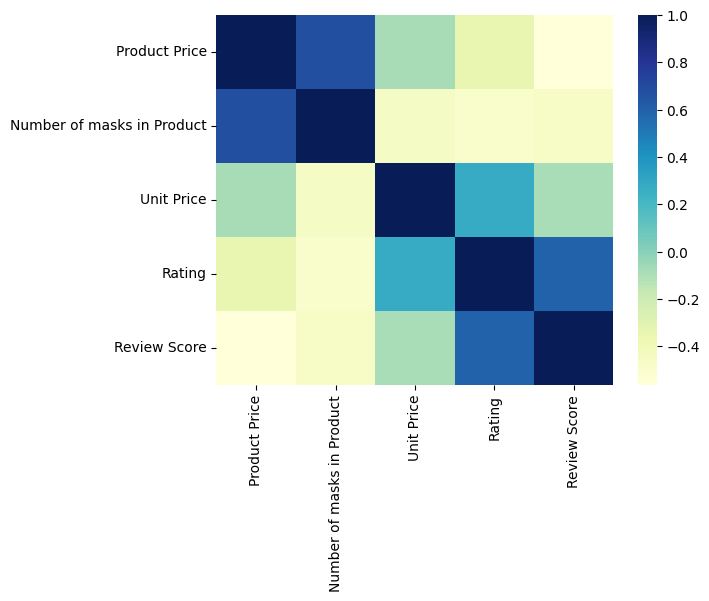

In [15]:
reviews_df['product_id'] = reviews_df['productId']
ndf = pd.concat([products_df[['product_id','product_price','Number','UnitPrice']],reviews_df[['product_id','ratingValue','score']]]).groupby('product_id').mean()
# ndf.corr()

ndf.reset_index(level=0, inplace=True)
# ndf

corr_df2 = ndf
# onehotType = pd.get_dummies(products_df[['product_id','Type']],columns=['Type'])
# corr_df2 =ndf.merge(onehotType, left_on='product_id', right_on='product_id')


corr_df2.rename(columns={'score': 'Review Score', 'ratingValue': 'Rating', 'UnitPrice': 'Unit Price', 'product_price': 'Product Price','Number': 'Number of masks in Product'}, inplace=True)
corr_df2 = corr_df2.loc[:, corr_df2.columns != 'product_id']
# onehotType
dataplot = sb.heatmap(corr_df2.corr(), cmap="YlGnBu", annot=False)
  
# displaying heatmap
mp.show()

Translate Review Titles Which are untranslated

In [16]:
# from translate import Translator
# reviews_df['reviewTitle-Eng'] = reviews_df.apply(lambda X: Translator(from_lang=X['languageCode.1'],to_lang="en-US").translate(X['reviewTitle']) if X['languageCode.1'] != "en-US" else X['reviewTitle'], axis=1)

What are the most popular face masks in the store and what are their key
features (e.g. price, material, design)?

Text(0, 0.5, 'Number of Reviews')

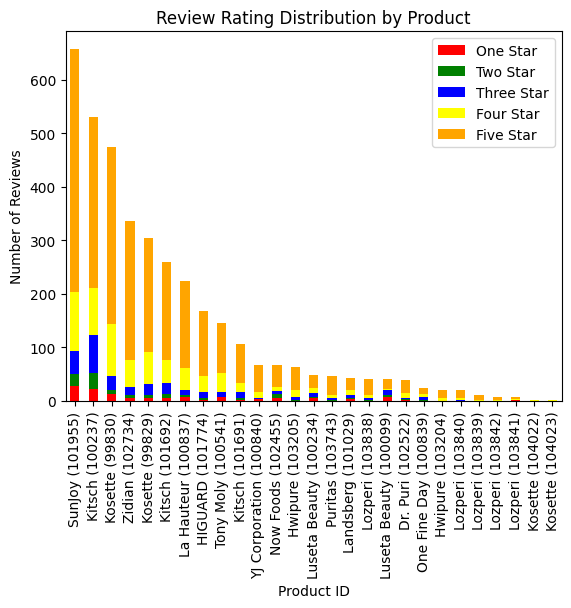

In [17]:
# reviews_df['productId'] = reviews_df.productId.astype(str)
import matplotlib.pyplot as plt

product_analysis_df = pd.DataFrame()
ids = []
names = []
tens = []
twenties = []
thirties = []
forties = []
fifties = []
totals = []
for i in products_df['product_id']:
  ids.append(i)
  names.append(products_df.loc[products_df['product_id']==i]['product_name'])
  product_reviews = reviews_df.loc[reviews_df['productId']==i]
  rating_values = product_reviews['ratingValue'].value_counts()
  rating_value_keys = list(product_reviews['ratingValue'].value_counts().keys())
  # print("Product ID ",i," has ",len(product_reviews)," reviews.")
  totals.append(len(product_reviews))
  if 10 in rating_value_keys:
    tens.append(rating_values[10])
  else:
    tens.append(0)
  if 20 in rating_value_keys:
    twenties.append(rating_values[20])
  else:
    twenties.append(0)
  if 30 in rating_value_keys:
    thirties.append(rating_values[30])
  else:
    thirties.append(0)
  if 40 in rating_value_keys:
    forties.append(rating_values[40])
  else:
    forties.append(0)  
  if 50 in rating_value_keys:
    fifties.append(rating_values[50])
  else:
    fifties.append(0)
  # print(ratings)
def get_brand(text):
  pid=int(text)
  name = products_df.loc[products_df['product_id']==pid]['Brand'].item()
  return name+" ("+str(text)+")"
# print(names)
ids = [get_brand(i) for i in ids]
stack_plot_df = pd.DataFrame({'One Star': tens,
                   'Two Star': twenties,
                   'Three Star': thirties,
                   'Four Star':forties,
                   'Five Star':fifties,
                   'Totals':totals},
                  index=ids)

stack_plot_df.sort_values(by=['Totals','Five Star', 'Four Star','Three Star','Two Star','One Star'],ascending=False, inplace=True)
stack_plot_df = stack_plot_df. loc[:, stack_plot_df. columns != 'Totals']
stack_plot_df.plot(kind='bar', stacked=True, color=['red', 'green','blue','yellow','orange'])
# stack_plot_df['Mask']=stack_plot_df['product_id'].apply(get_brand)
# Add Title and Labels
plt.title('Review Rating Distribution by Product')
plt.xlabel('Product ID')
plt.ylabel('Number of Reviews')
# plt.xticks(rotation = 80)

# product_analysis_df.loc[product_analysis_df['product_id']=='101955']
# import seaborn as sns
# # import matplotlib.pyplot as plt
# # fig, ax = plt.subplots(figsize=(12, 48))

# # # sns.swarmplot(data=reviews_df, x="ratingValue", y="productId")
# # sns.objects.Plot(reviews_df, x="productId", color="ratingValue").add(sns.objects.Bar(), sns.objects.Count(), sns.objects.Stack())

# # plt.show()


# #set seaborn plotting aesthetics
# sns.set(style='white')

# #create stacked bar chart
# reviews_df.set_index('productId').plot(kind='bar', stacked=True, color=['steelblue', 'red'])

# #add overall title
# plt.title('Customers by Time & Day of Week', fontsize=16)

# #add axis titles
# plt.xlabel('Day of Week')
# plt.ylabel('Number of Customers')

# #rotate x-axis labels
# plt.xticks(rotation=45)

In [18]:
import numpy as np
analysis_df = pd.DataFrame()
analysis_df['product_id'] = products_df['product_id']
# analysis_df.set_index('product_id')
analysis_df['ProductName'] = products_df['product_name']
analysis_df['Brand'] = products_df['Brand']
analysis_df['Number'] = products_df['Number']
analysis_df['UnitPrice'] = products_df['UnitPrice']
analysis_df['Price'] = products_df['product_price']
analysis_df['Type'] = products_df['Type']
analysis_df['reviews_total'] = np.nan
analysis_df['reviews_tens'] = np.nan
analysis_df['reviews_twenties'] = np.nan
analysis_df['reviews_thirties'] = np.nan
analysis_df['reviews_forties'] = np.nan
analysis_df['reviews_fifties'] = np.nan

for i in analysis_df.index:
  # print(type(i))
  pid = analysis_df.at[i,'product_id']
  temp_df = reviews_df.loc[reviews_df['productId']==pid]
  rating_values = temp_df['ratingValue'].value_counts()
  rating_value_keys = list(temp_df['ratingValue'].value_counts().keys())
  if 10 in rating_value_keys:
    tens = rating_values[10]
  else:
    tens = 0
  if 20 in rating_value_keys:
    twenties = rating_values[20]
  else:
    twenties = 0
  if 30 in rating_value_keys:
    thirties = rating_values[30]
  else:
    thirties = 0
  if 40 in rating_value_keys:
    forties = rating_values[40]
  else:
    forties = 0  
  if 50 in rating_value_keys:
    fifties = rating_values[50]
  else:
    fifties = 0
  analysis_df.at[i,'reviews_total'] = len(temp_df)
  analysis_df.at[i,'reviews_tens'] = tens
  analysis_df.at[i,'reviews_twenties'] = twenties
  analysis_df.at[i,'reviews_thirties'] = thirties
  analysis_df.at[i,'reviews_forties'] = forties
  analysis_df.at[i,'reviews_fifties'] = fifties
  # print (len(temp_df),tens,twenties,thirties,forties,fifties)
  # np.where(product_specific_df['languageCode.1']=='en-US', product_specific_df['reviewText'], product_specific_df['translation.reviewText'])
analysis_df.to_csv('analysis_df.csv')


In [19]:
reviews_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3765 entries, 0 to 3848
Data columns (total 20 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   abuseCount                          3765 non-null   int64  
 1   customerNickname                    3765 non-null   object 
 2   helpfulNo                           3765 non-null   int64  
 3   helpfulYes                          3765 non-null   int64  
 4   id                                  3765 non-null   object 
 5   imagesCount                         3765 non-null   int64  
 6   languageCode                        3765 non-null   object 
 7   postedDate                          3765 non-null   object 
 8   productId                           3765 non-null   int64  
 9   profileInfo.ugcSummary.answerCount  3759 non-null   float64
 10  profileInfo.ugcSummary.reviewCount  3759 non-null   float64
 11  ratingValue                         3765 no

In [20]:
## Data Cleaning
# pd.set_option('max_colwidth', None)

# pd.set_option('display.max_rows', None)
# reviews_df['EnglishReview'] = np.where(reviews_df['languageCode.1']=='en-US', reviews_df['reviewText'], reviews_df['translation.reviewText'])
# reviews_df.loc[reviews_df['id']=='46952c82-d750-41c5-b8f2-92579bb8039c']['EnglishReview']# = "The mask, in principle, is cool. Made of pleasant natural fabric, thin. But!!! you need to know that after the first wash it does not significantly decrease in size. Suitable for a child or a girl with a small face. Therefore, for a small face - 5+++! For a standard adult - 4 not because of quality, but because of size"
# reviews_df.loc[132]['EnglishReview'] = "The mask, in principle, is cool. Made of pleasant natural fabric, thin. But!!! you need to know that after the first wash it does not significantly decrease in size. Suitable for a child or a girl with a small face. Therefore, for a small face - 5+++! For a standard adult - 4 not because of quality, but because of size"
reviews_df.loc[reviews_df['id']=='46952c82-d750-41c5-b8f2-92579bb8039c','languageCode'] = 'ru-RU'
reviews_df.loc[reviews_df['id']=='46952c82-d750-41c5-b8f2-92579bb8039c','languageCode.1'] = 'ru-RU'
reviews_df.loc[reviews_df['id']=='46952c82-d750-41c5-b8f2-92579bb8039c','translation.reviewText'] = "The mask, in principle, is cool. Made of pleasant natural fabric, thin. But!!! you need to know that after the first wash it does not significantly decrease in size. Suitable for a child or a girl with a small face. Therefore, for a small face - 5+++! For a standard adult - 4 not because of quality, but because of size"

{'Positive': 10, 'Neutral': 2}
en-US    6
ru-RU    5
he-IL    1
Name: languageCode.1, dtype: int64
50    10
40     2
Name: ratingValue, dtype: int64


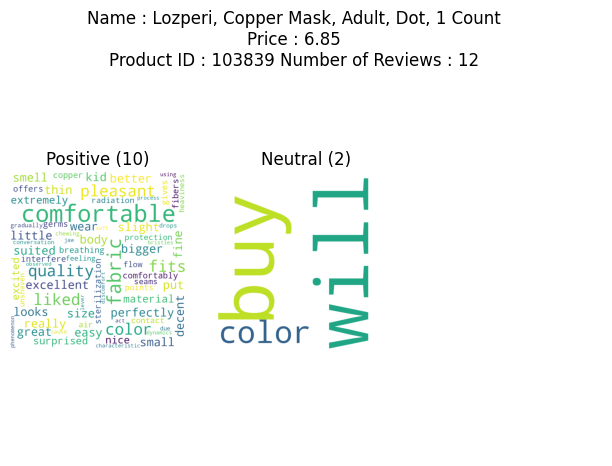

{'Positive': 98, 'Negative': 5, 'Neutral': 4}
en-US    51
he-IL    26
ru-RU    17
ja-JP     9
ar-SA     3
es-MX     1
Name: languageCode.1, dtype: int64
50    74
40    16
30    11
20     4
10     2
Name: ratingValue, dtype: int64


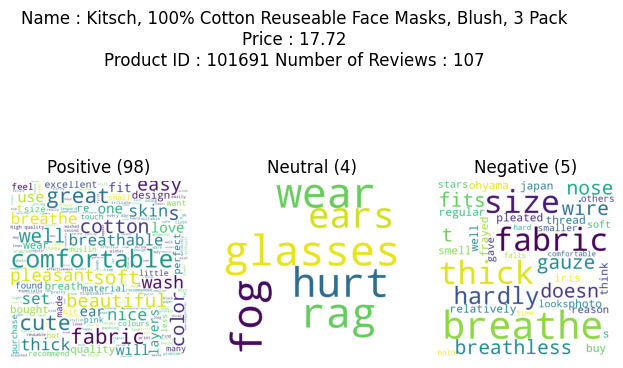

{'Positive': 51, 'Negative': 9, 'Neutral': 8}
en-US    35
ru-RU    23
ja-JP     5
ar-SA     3
he-IL     2
Name: languageCode.1, dtype: int64
50    42
40     7
20     7
10     6
30     6
Name: ratingValue, dtype: int64


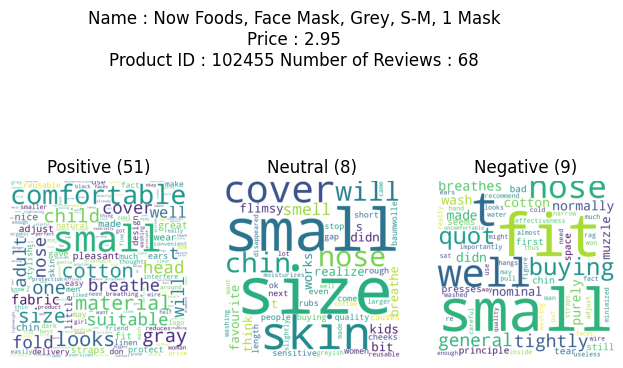

{'Positive': 20, 'Neutral': 1}
en-US    17
es-MX     1
fr-FR     1
ru-RU     1
ko-KR     1
Name: languageCode.1, dtype: int64
50    16
40     5
Name: ratingValue, dtype: int64


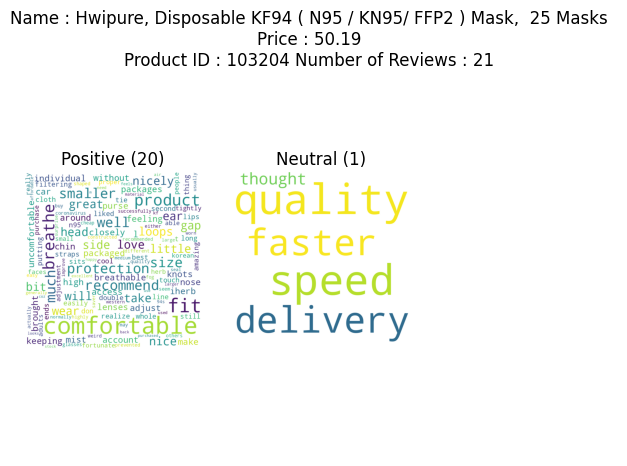

{'Positive': 51, 'Neutral': 10, 'Negative': 2}
en-US    31
ru-RU    24
ar-SA     4
zh-CN     2
fr-FR     1
zh-TW     1
Name: languageCode.1, dtype: int64
50    43
40    13
30     6
20     1
Name: ratingValue, dtype: int64


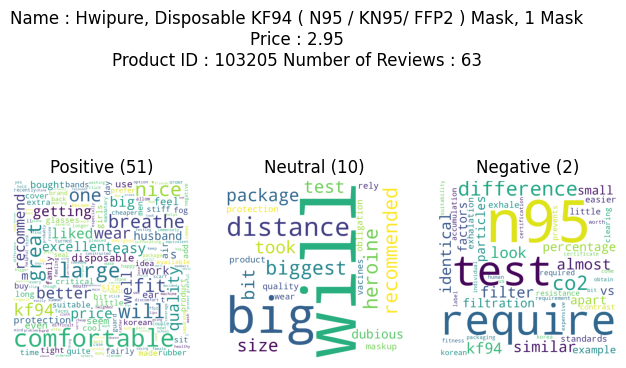

{'Positive': 6, 'Negative': 2}
en-US    4
ru-RU    4
Name: languageCode.1, dtype: int64
50    6
40    2
Name: ratingValue, dtype: int64


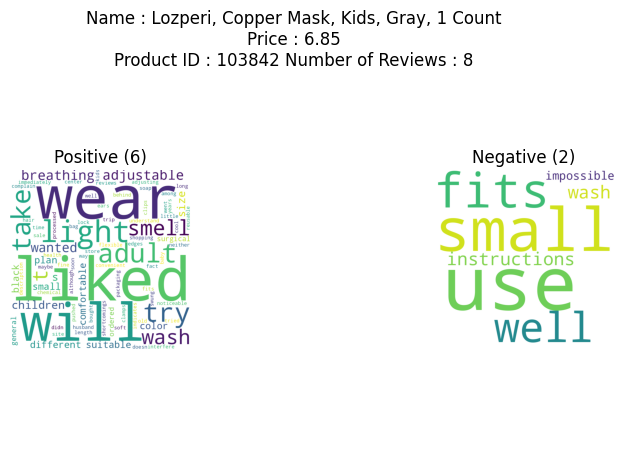

{'Positive': 121, 'Negative': 12, 'Neutral': 12}
en-US    90
ru-RU    40
ar-SA     7
de-DE     3
ja-JP     2
he-IL     2
es-MX     1
Name: languageCode.1, dtype: int64
50    93
40    36
30     8
10     7
20     1
Name: ratingValue, dtype: int64


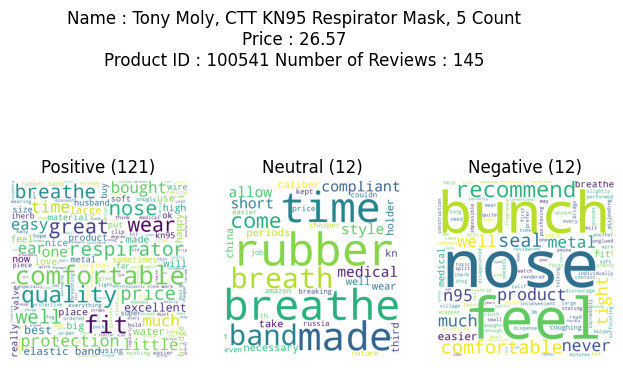

{'Positive': 34, 'Negative': 5, 'Neutral': 3}
en-US    17
ru-RU    13
ar-SA     4
ja-JP     3
he-IL     2
zh-TW     1
fr-FR     1
ko-KR     1
Name: languageCode.1, dtype: int64
50    31
40     6
30     4
20     1
Name: ratingValue, dtype: int64


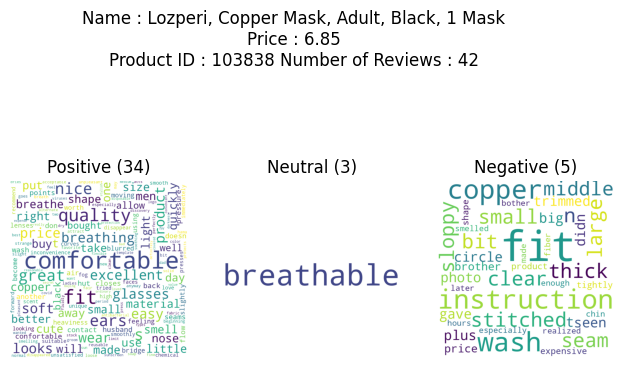

{'Positive': 37, 'Negative': 6, 'Neutral': 6}
en-US    30
ar-SA    11
ru-RU     5
es-MX     2
fr-FR     1
Name: languageCode.1, dtype: int64
50    25
40    10
10     6
30     6
20     2
Name: ratingValue, dtype: int64


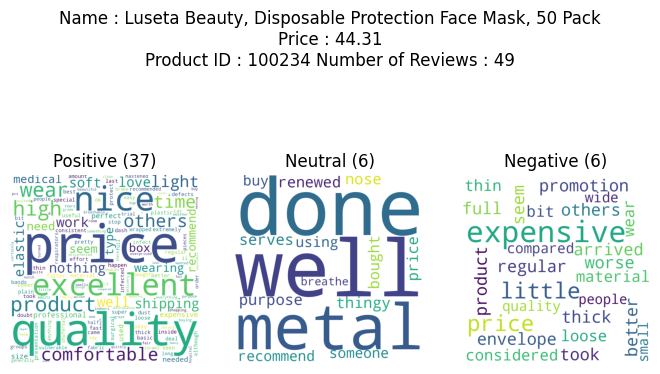

{'Positive': 394, 'Neutral': 44, 'Negative': 37}
ru-RU    200
en-US    199
ar-SA     50
ja-JP     10
fr-FR      8
zh-TW      3
he-IL      2
zh-CN      1
ko-KR      1
es-MX      1
Name: languageCode.1, dtype: int64
50    332
40     97
30     26
10     13
20      7
Name: ratingValue, dtype: int64


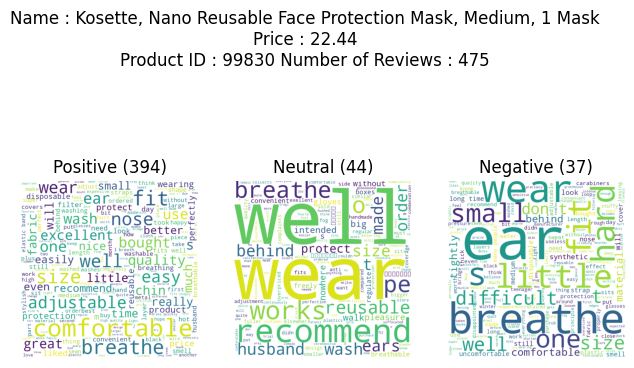

{'Positive': 19, 'Neutral': 3, 'Negative': 3}
en-US    14
ru-RU     6
fr-FR     2
ko-KR     1
ja-JP     1
ar-SA     1
Name: languageCode.1, dtype: int64
50    12
40     6
30     5
20     2
Name: ratingValue, dtype: int64


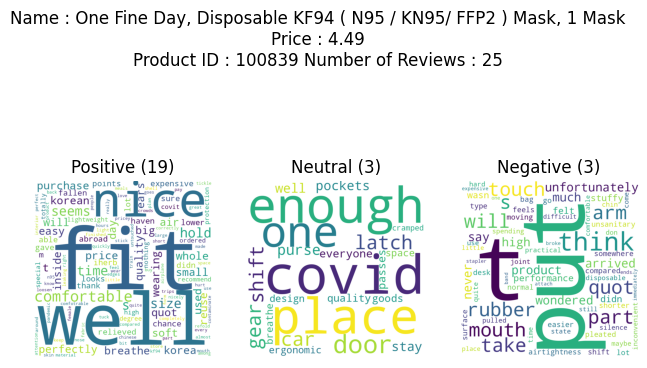

{'Positive': 34, 'Negative': 5, 'Neutral': 4}
en-US    29
ru-RU     6
he-IL     2
ja-JP     2
zh-CN     1
de-DE     1
fr-FR     1
ar-SA     1
Name: languageCode.1, dtype: int64
50    23
40     9
30     5
10     4
20     2
Name: ratingValue, dtype: int64


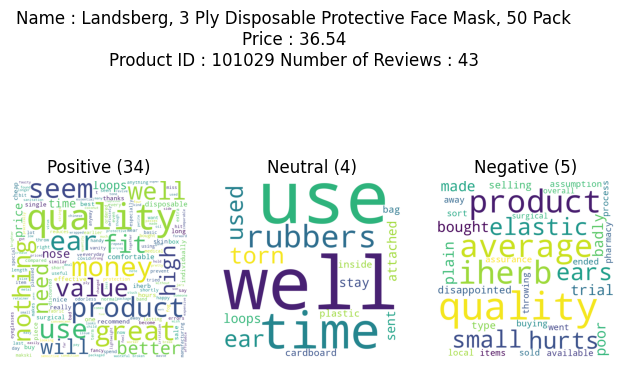

{'Positive': 56, 'Negative': 7, 'Neutral': 5}
ru-RU    36
en-US    18
ar-SA    10
es-MX     2
ja-JP     1
ko-KR     1
Name: languageCode.1, dtype: int64
50    51
40    11
10     3
30     2
20     1
Name: ratingValue, dtype: int64


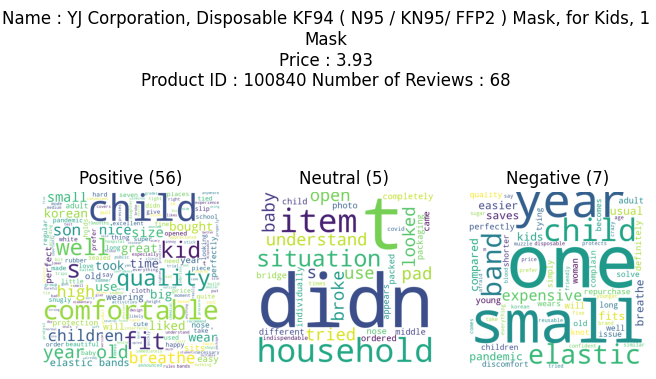

{'Positive': 42, 'Neutral': 3, 'Negative': 1}
en-US    18
ru-RU    17
ja-JP     4
ar-SA     2
zh-TW     2
fr-FR     2
es-MX     1
Name: languageCode.1, dtype: int64
50    34
40     7
30     3
20     2
Name: ratingValue, dtype: int64


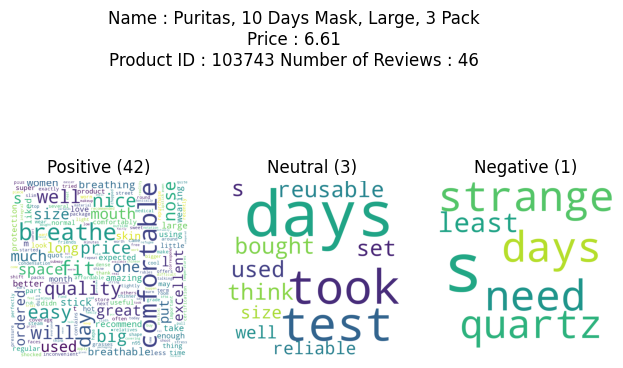

{'Positive': 35, 'Negative': 3, 'Neutral': 2}
en-US    24
ru-RU     8
fr-FR     3
ar-SA     2
ja-JP     2
ko-KR     1
Name: languageCode.1, dtype: int64
50    26
40     9
30     2
20     2
10     1
Name: ratingValue, dtype: int64


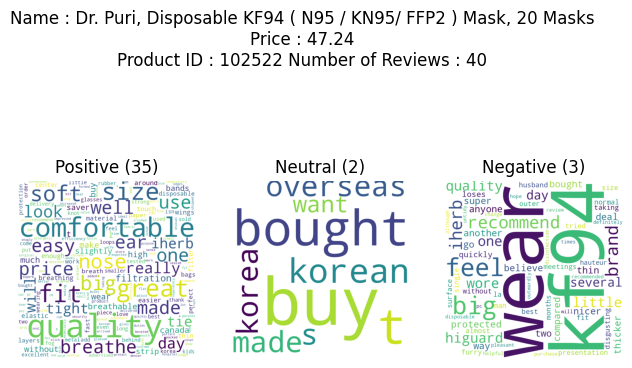

{'Positive': 183, 'Neutral': 23, 'Negative': 19}
en-US    109
ru-RU     77
ar-SA     14
ja-JP     11
ko-KR      5
fr-FR      4
zh-CN      1
zh-TW      1
de-DE      1
es-MX      1
he-IL      1
Name: languageCode.1, dtype: int64
50    163
40     42
30      8
10      7
20      5
Name: ratingValue, dtype: int64


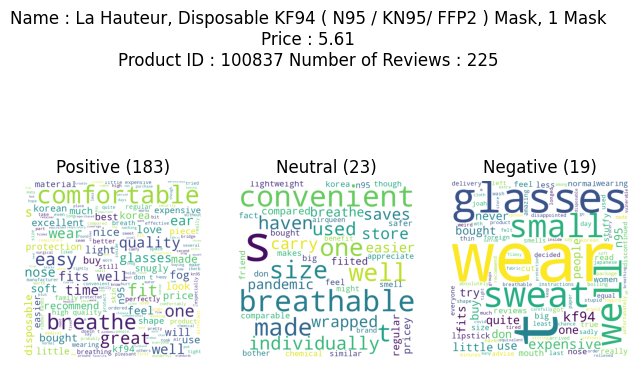

{'Positive': 264, 'Negative': 21, 'Neutral': 19}
ru-RU    142
en-US    115
ar-SA     28
ja-JP      7
he-IL      3
pt-BR      3
fr-FR      2
zh-TW      2
de-DE      2
Name: languageCode.1, dtype: int64
50    212
40     60
30     20
20      7
10      5
Name: ratingValue, dtype: int64


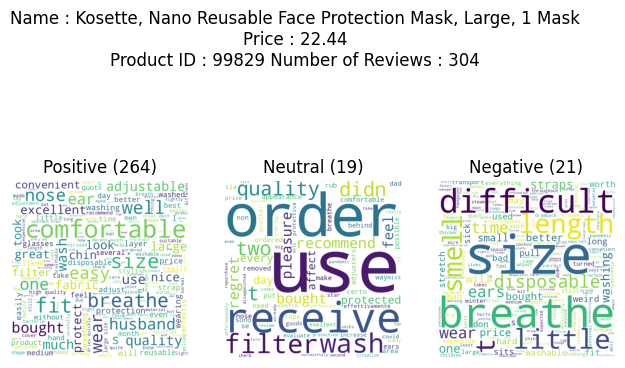

{'Positive': 293, 'Negative': 25, 'Neutral': 19}
en-US    158
ru-RU    141
fr-FR     15
ar-SA     13
ja-JP      6
he-IL      2
zh-TW      1
es-MX      1
Name: languageCode.1, dtype: int64
50    261
40     50
30     15
20      6
10      5
Name: ratingValue, dtype: int64


KeyboardInterrupt: ignored

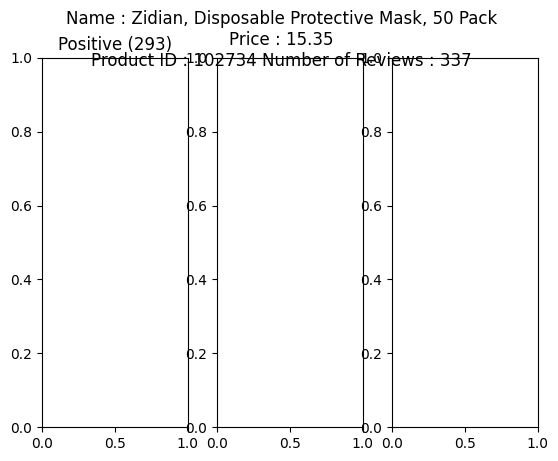

In [21]:
import numpy as np
for i in reviews_df['productId'].unique():
  number_of_reviews = len(reviews_df.loc[reviews_df['productId'] == i])
  name = "Name : "+products_df.loc[products_df['product_id']==i]['product_name'].item()
  price = "Price : "+str(products_df.loc[products_df['product_id']==i]['product_price'].item())
  pid = "Product ID : "+str(i)+" Number of Reviews : "+str(number_of_reviews)
  product_specific_df = reviews_df.loc[reviews_df['productId'] == i].copy()
  product_specific_df['EnglishReview'] = np.where(product_specific_df['languageCode.1']=='en-US', product_specific_df['reviewText'], product_specific_df['translation.reviewText'])
  # product_specific_df['DetectedLanguage'] = product_specific_df['EnglishReview'].apply(getLanguage)
  product_specific_df[['polarity', 'subjectivity']] = product_specific_df['EnglishReview'].apply(lambda EnglishReview: pd.Series(TextBlob(EnglishReview).sentiment))
  product_specific_df['Text_Analysis']=product_specific_df['polarity'].apply(getAnalysis )
  text_analysis_dict = product_specific_df['Text_Analysis'].value_counts().to_dict()
  print(text_analysis_dict)
  print(product_specific_df['languageCode.1'].value_counts())
  print(product_specific_df['ratingValue'].value_counts())
  # print(product_specific_df['DetectedLanguage'].value_counts())
  # print(product_specific_df.loc[product_specific_df['DetectedLanguage']!='en'][['EnglishReview','DetectedLanguage']])
  fig, axs = plt.subplots(1, 3)
  fig.suptitle(name+'\n'+price+'\n'+pid,wrap=True)
  for j in product_specific_df['Text_Analysis'].unique():
    # print(j)
    if j == 'Positive': 
      plt.subplot(1, 3, 1)
      title = 'Positive ('+str(text_analysis_dict[j])+')'
      axs[0].set_title(title)
    if j == 'Neutral': 
      title = 'Neutral ('+str(text_analysis_dict[j])+')'
      plt.subplot(1, 3, 2)
      axs[1].set_title(title)
    if j == 'Negative': 
      title = 'Negative ('+str(text_analysis_dict[j])+')'
      plt.subplot(1, 3, 3)
      axs[2].set_title(title)
    plot_wordcloud(product_specific_df.loc[product_specific_df['Text_Analysis'] == j])
  plt.axis("off")
  plt.tight_layout(pad = 0)
  for ax in axs.flat:
    ax.axis('off')
  plt.show()
  print("================================================================")
  if number_of_reviews<5:
    print(product_specific_df['EnglishReview'])
# print(reviews_df)

In [23]:
an_df = pd.DataFrame()
country_dict = {'en-US': 'United States', 'ru-RU': 'Russia', 'ar-SA': 'Saudi Arabia', 'he-IL': 'Israel', 'ja-JP': 'Japan', 'fr-FR': 'France', 'zh-TW': 'Taiwan', 'ko-KR': 'Korea', 'es-MX': 'Mexico', 'zh-CN': 'China', 'de-DE': 'Germany', 'pt-BR': 'Brazil'}
def get_country(text):
  return country_dict[text]
reviews_df['Country'] = reviews_df['languageCode'].apply(get_country)
an_df['product_id'] = reviews_df['productId']
an_df['Country'] = reviews_df['languageCode'].apply(get_country)
an_df['rating'] = reviews_df['ratingValue']
# an_df['Count'] = reviews_df['productId']

pivot1 = pd.pivot_table(data=an_df,index = ['product_id','Country'],aggfunc=('count','mean'))
pivot1.columns = pivot1.columns.droplevel(0) #remove amount
pivot1.columns.name = None               #remove categories

pivot1 = pivot1.reset_index()                #index to columns


pivot1m = pivot1.merge(products_df[['product_id','product_price','Number','Type']], left_on='product_id', right_on='product_id')
pivot1m.rename(columns={'mean': 'Average Rating','count': 'Count','product_price': 'Price'}, inplace=True)
pivot1m
# pivot1m.to_json(r'/content/an_df_json.json',orient='records')



,product_id,Country,Count,Average Rating,Price,Number,Type
0,99829,Brazil,3,50.000000,22.44,1,reusable
1,99829,France,2,50.000000,22.44,1,reusable
2,99829,Germany,2,50.000000,22.44,1,reusable
3,99829,Israel,3,50.000000,22.44,1,reusable
4,99829,Japan,7,38.571429,22.44,1,reusable
...,...,...,...,...,...,...,...
163,103842,Russia,4,47.500000,6.85,1,reusable
164,103842,United States,4,47.500000,6.85,1,reusable
165,104022,Japan,1,50.000000,11.81,3,reusable
166,104022,United States,1,40.000000,11.81,3,reusable


([<matplotlib.axis.XTick at 0x7f1c2a88b9a0>,
 [Text(0, 0, '(2020, 20)'),
  Text(1, 0, '(2020, 21)'),
  Text(2, 0, '(2020, 22)'),
  Text(3, 0, '(2020, 23)'),
  Text(4, 0, '(2020, 24)'),
  Text(5, 0, '(2020, 25)'),
  Text(6, 0, '(2020, 26)'),
  Text(7, 0, '(2020, 27)'),
  Text(8, 0, '(2020, 28)'),
  Text(9, 0, '(2020, 29)'),
  Text(10, 0, '(2020, 30)'),
  Text(11, 0, '(2020, 31)'),
  Text(12, 0, '(2020, 32)'),
  Text(13, 0, '(2020, 33)'),
  Text(14, 0, '(2020, 34)'),
  Text(15, 0, '(2020, 35)'),
  Text(16, 0, '(2020, 36)'),
  Text(17, 0, '(2020, 37)'),
  Text(18, 0, '(2020, 38)'),
  Text(19, 0, '(2020, 39)'),
  Text(20, 0, '(2020, 40)'),
  Text(21, 0, '(2020, 41)'),
  Text(22, 0, '(2020, 42)'),
  Text(23, 0, '(2020, 43)'),
  Text(24, 0, '(2020, 44)'),
  Text(25, 0, '(2020, 45)'),
  Text(26, 0, '(2020, 46)'),
  Text(27, 0, '(2020, 47)'),
  Text(28, 0, '(2020, 48)'),
  Text(29, 0, '(2020, 49)'),
  Text(30, 0, '(2020, 50)'),
  Text(31, 0, '(2020, 51)'),
  Text(32, 0, '(2020, 52)'),
  Text(3

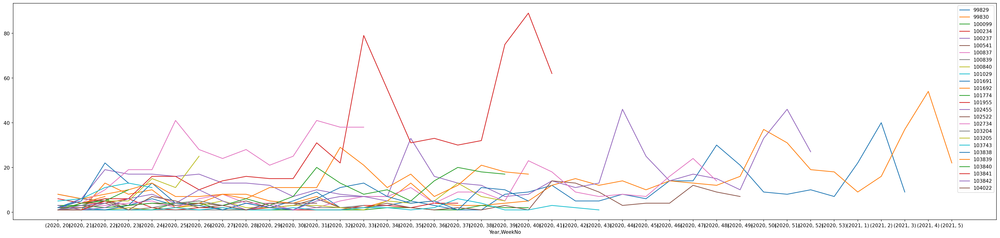

In [24]:
from datetime import datetime
def convert_to_datetime(text):
  try:
    dt = datetime.strptime(text, '%Y-%m-%dT%H:%M:%S.%fZ')
  except:
    dt = datetime.strptime(text, '%Y-%m-%dT%H:%M:%SZ')
  return dt
reviews_df['DateTime'] = reviews_df['postedDate'].apply(convert_to_datetime)
# datestring = reviews_df['postedDate'][0]
# dt = datetime.strptime(datestring, '%Y-%m-%dT%H:%M:%S.%fZ')
# print(dt.year, dt.month, dt.weekday())
# Monday is 0 and Sunday is 7
# Mask review habbit correlate with lockdown corona case count by country
# reviews_df['DateTime'] = reviews_df['postedDate'].apply(convert_to_datetime)
# reviews_df['DateTime'].max()
#Earliest Date 2020-05-12 13:35:10.337000
#Latest Date 2021-02-07 00:56:39.055000
def get_year(dt):
  if dt.month == 1 and dt.week>50:
    return dt.year-1
  else:
    return dt.year
def get_weekno(dt):
  return dt.week
def get_type(text):
  if 'disposable' in text.lower():
    return 'disposable'
  else:
    return 'reusable'
products_df['Type'] = products_df['product_name'].apply(get_type)

timeseries_df = pd.DataFrame()
timeseries_df['productId'] = reviews_df['productId']
timeseries_df['Year'] = reviews_df['DateTime'].apply(get_year)
timeseries_df['WeekNo'] = reviews_df['DateTime'].apply(get_weekno)
timeseries_df['Quantity'] = reviews_df['productId']
timeseries_df
pivot = pd.pivot_table(data=timeseries_df,index = ['productId','Year','WeekNo'],aggfunc='count')
# pivot.plot(figsize=(16,16))
# pivot.loc[2020,53]['Quantity'] += pivot.loc[2021,53]['Quantity']
# pivot.loc[2021,53]['Quantity'] = 0
# # pivot.loc[2021,53]['ProductId']
# pivot.drop(index=(2021, 53))
# pivot = pivot.loc[~(pivot['Quantity']==0)]


# pivot.columns = pivot.columns.droplevel(0) #remove amount
pivot.columns.name = None               #remove categories

pivot = pivot.reset_index()                #index to columns

# pivot.plot(figsize=(16,16),kind='line')
pivot
pivot = pivot.set_index(['Year','WeekNo'])

# fig, ax = plt.subplots()
plt.figure(figsize=(36,8),dpi=150)
for label, grp in pivot.groupby('productId'):
  # print(label,"\n",grp)
  if len(grp)>1:
    grp['Quantity'].plot(label=label)
  # grp.plot(x = grp.index, y = 'Quantity',ax = ax, label = label)
plt.legend()
x = list(pivot.index.drop_duplicates())
x.sort()
default_x_ticks = range(len(x))
plt.xticks(default_x_ticks, x)

In [25]:
pivot.transpose()
pivot#.to_csv('product_time.csv')

productId  Quantity
Year WeekNo                     
2020 20          99829         2
     21          99829         6
     22          99829         5
     23          99829         3
     24          99829         6
...                ...       ...
2021 4          103842         3
     5          103842         4
     4          104022         1
     5          104022         1
     5          104023         2

[430 rows x 2 columns]

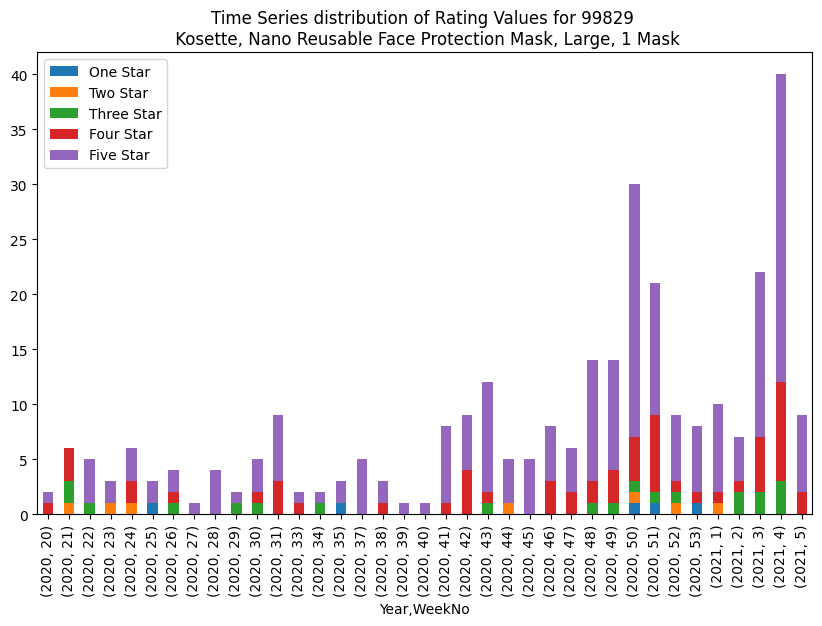

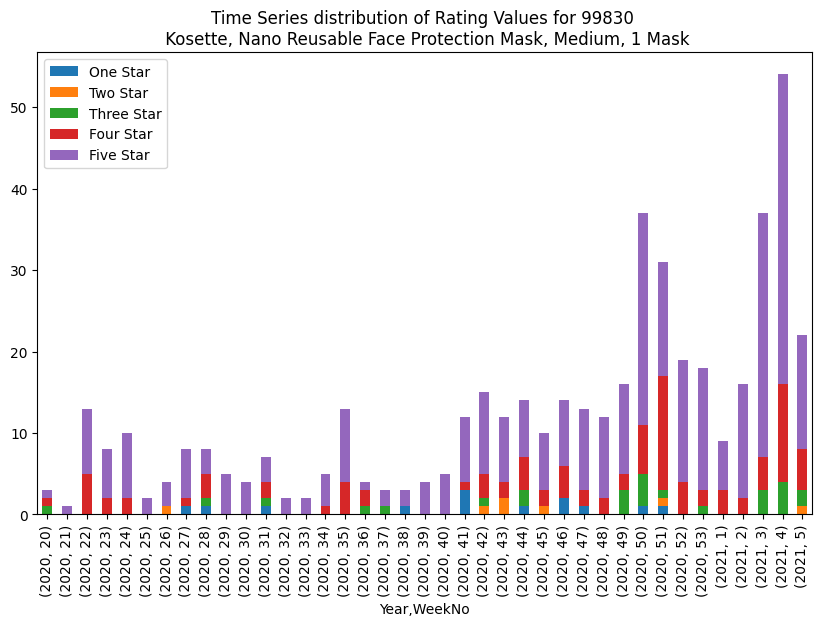

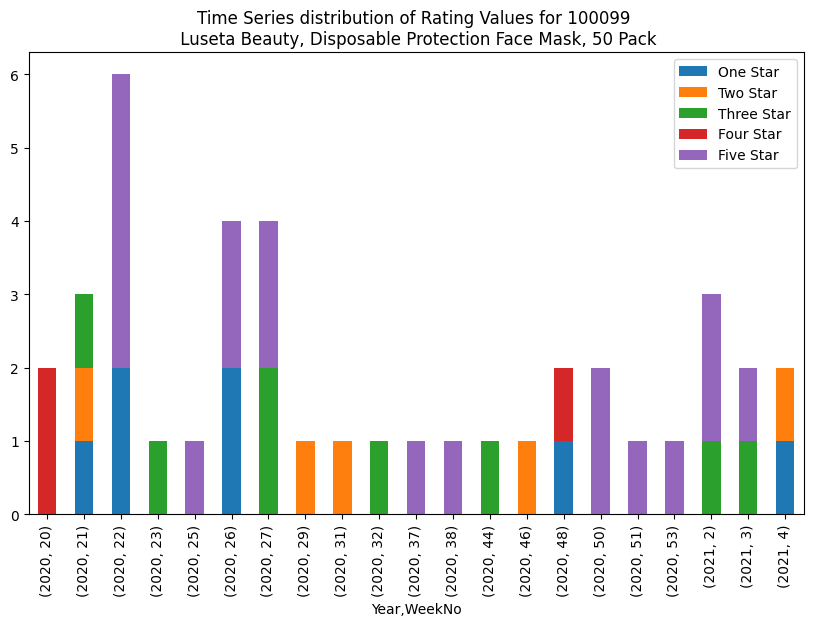

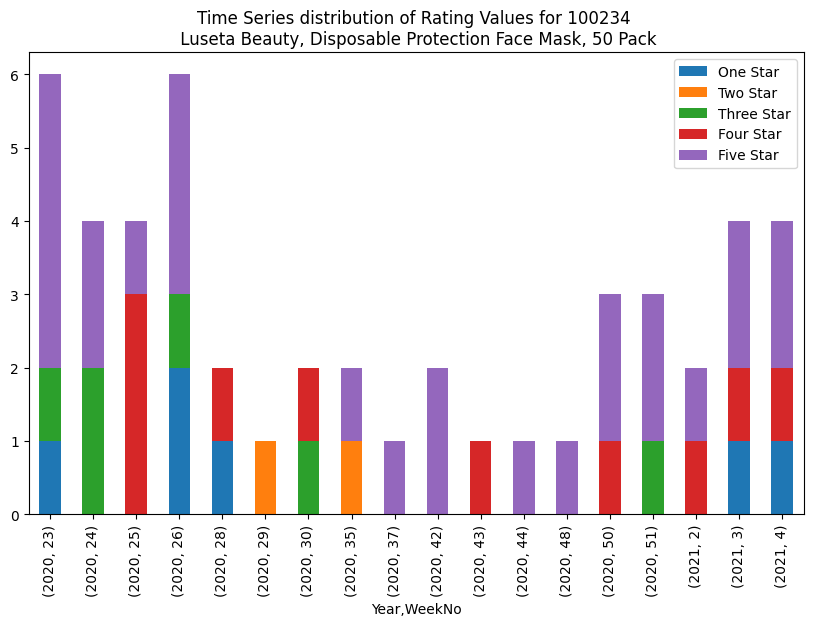

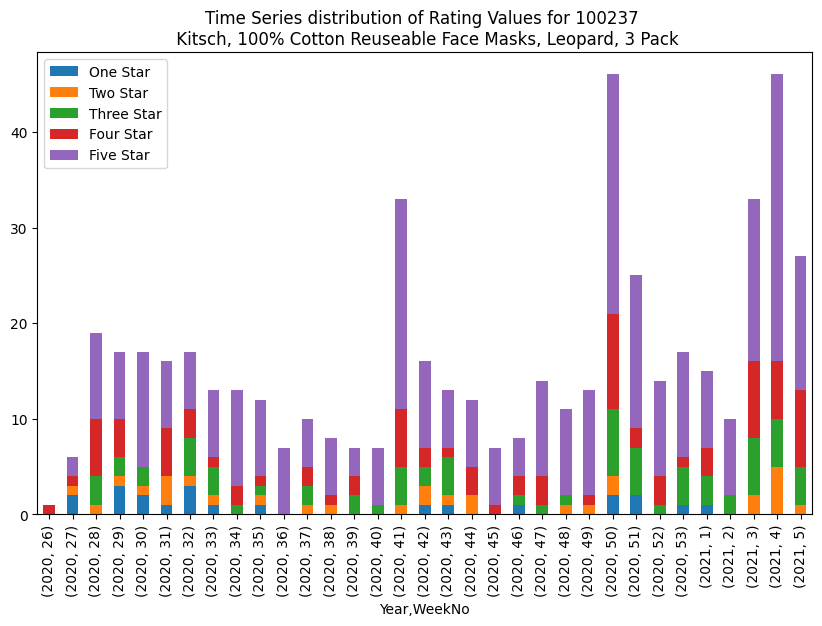

...

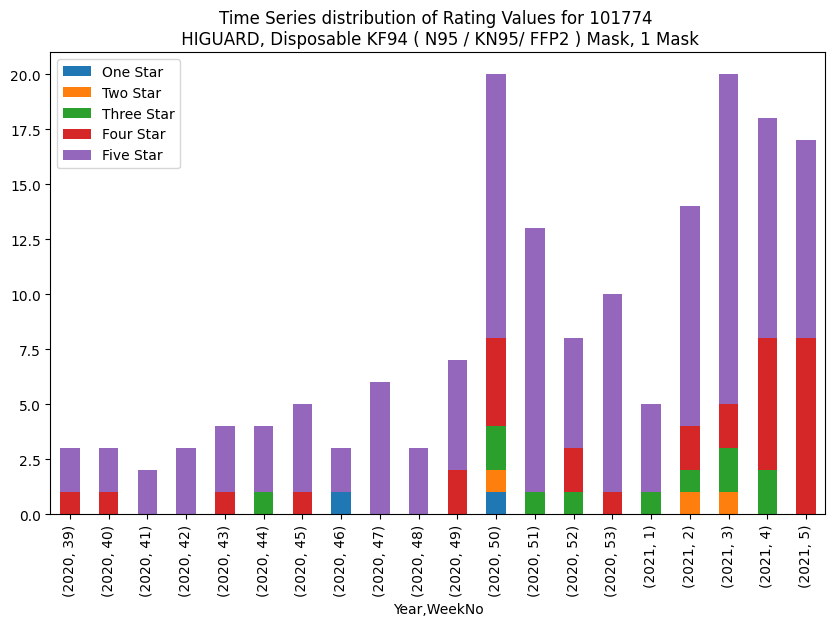

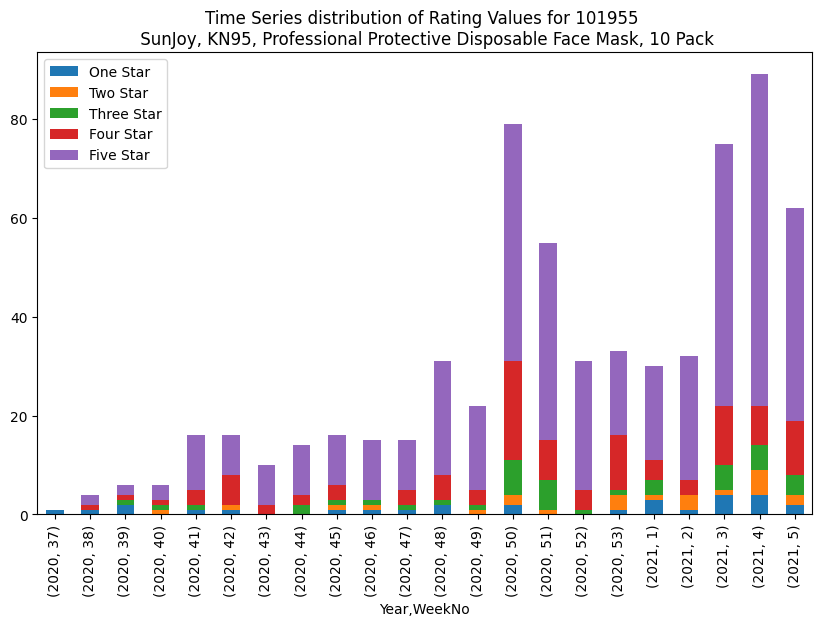

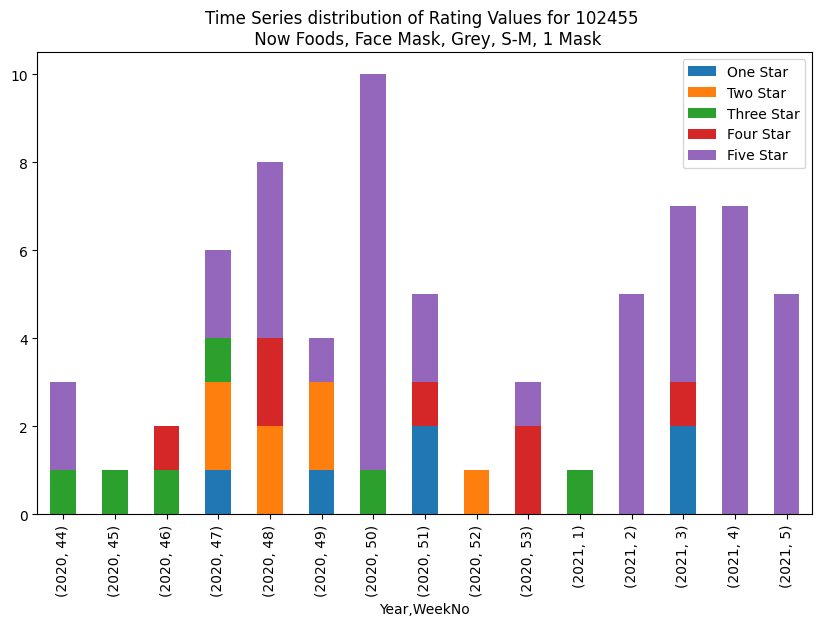

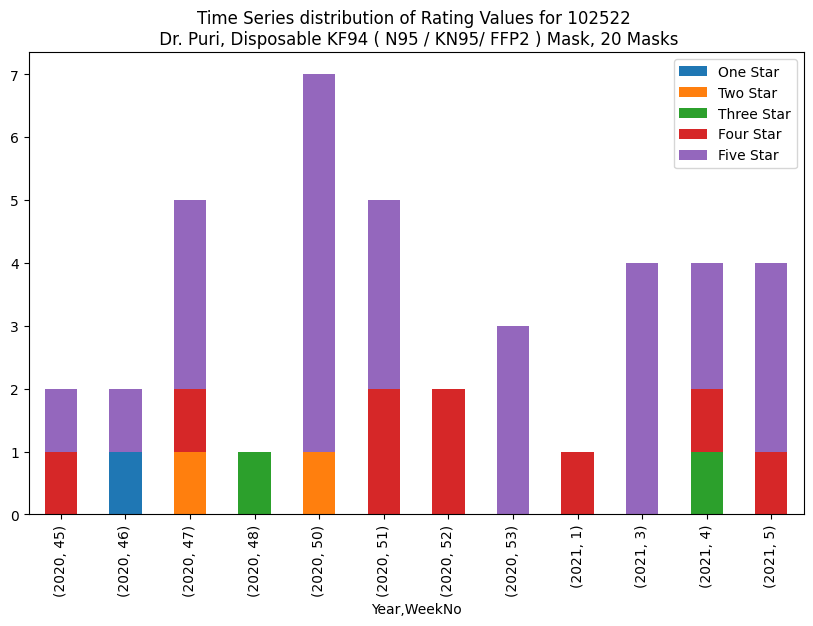

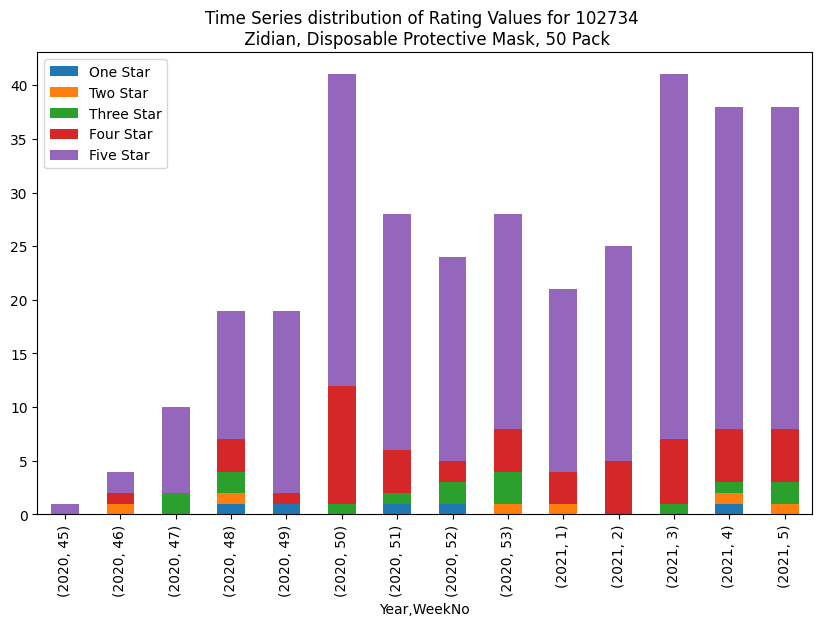

In [26]:
from datetime import datetime
def convert_to_datetime(text):
  try:
    dt = datetime.strptime(text, '%Y-%m-%dT%H:%M:%S.%fZ')
  except:
    dt = datetime.strptime(text, '%Y-%m-%dT%H:%M:%SZ')
  return dt
reviews_df['DateTime'] = reviews_df['postedDate'].apply(convert_to_datetime)
# datestring = reviews_df['postedDate'][0]
# dt = datetime.strptime(datestring, '%Y-%m-%dT%H:%M:%S.%fZ')
# print(dt.year, dt.month, dt.weekday())
# Monday is 0 and Sunday is 7
# Mask review habbit correlate with lockdown corona case count by country
# reviews_df['DateTime'] = reviews_df['postedDate'].apply(convert_to_datetime)
# reviews_df['DateTime'].max()
#Earliest Date 2020-05-12 13:35:10.337000
#Latest Date 2021-02-07 00:56:39.055000
def get_year(dt):
  if dt.month == 1 and dt.week>50:
    return dt.year-1
  else:
    return dt.year
def get_weekno(dt):
  return dt.week
def get_type(text):
  if 'disposable' in text.lower():
    return 'disposable'
  else:
    return 'reusable'
products_df['Type'] = products_df['product_name'].apply(get_type)
def get_rate_count(text,calling_from):
  if int(text)==calling_from:
    return 1
  else:
    return 0
def get_one(text):
  return 1
timeseries_df = pd.DataFrame()
# timeseries_df['Type'] = 
timeseries_df['productId'] = reviews_df['productId']
timeseries_df['Year'] = reviews_df['DateTime'].apply(get_year)
timeseries_df['WeekNo'] = reviews_df['DateTime'].apply(get_weekno)
timeseries_df['Quantity'] = reviews_df['productId'].apply(get_one)
timeseries_df['One Star'] = reviews_df['ratingValue'].apply(get_rate_count,calling_from=10)
timeseries_df['Two Star'] = reviews_df['ratingValue'].apply(get_rate_count,calling_from=20)
timeseries_df['Three Star'] = reviews_df['ratingValue'].apply(get_rate_count,calling_from=30)
timeseries_df['Four Star'] = reviews_df['ratingValue'].apply(get_rate_count,calling_from=40)
timeseries_df['Five Star'] = reviews_df['ratingValue'].apply(get_rate_count,calling_from=50)

pivot = pd.pivot_table(data=timeseries_df,index = ['productId','Year','WeekNo'],aggfunc='sum')
# pivot.plot(figsize=(16,16))
# pivot.loc[2020,53]['Quantity'] += pivot.loc[2021,53]['Quantity']
# pivot.loc[2021,53]['Quantity'] = 0
# # pivot.loc[2021,53]['ProductId']
# pivot.drop(index=(2021, 53))
# pivot = pivot.loc[~(pivot['Quantity']==0)]


# pivot.columns = pivot.columns.droplevel(0) #remove amount
pivot.columns.name = None               #remove categories

pivot = pivot.reset_index()                #index to columns

# pivot.plot(figsize=(16,16),kind='line')
# print(pivot.info())
timeseries_df
reviews_df
pivot = pivot.set_index(['Year','WeekNo'])

# fig, ax = plt.subplots()
# plt.figure(figsize=(36,8),dpi=150)
for label, grp in pivot.groupby('productId'):
  # print(label,"\n",grp)
  name = products_df.loc[products_df['product_id']==label]
  name = name['product_name'].item()
  if len(grp)>10:# and label==99830:
    # print(label)
    # print(grp)
    title = 'Time Series distribution of Rating Values for '+ str(label) +" \n "+name
    grp[['One Star','Two Star','Three Star','Four Star','Five Star']].plot.bar(stacked=True, figsize=(10, 6),title=title)
    # dfp.plot.bar(stacked=True, figsize=(10, 6), ylabel='Hours', xlabel='Date', title='Sum of Daily Category Hours')
    # plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')
  # grp.plot(x = grp.index, y = 'Quantity',ax = ax, label = label)
# plt.legend()
# x = list(pivot.index.drop_duplicates())
# x.sort()
# default_x_ticks = range(len(x))
# plt.xticks(default_x_ticks, x)

Generating Time Series Data By Mask for D3 Visualisation

In [27]:
from datetime import datetime
def convert_to_datetime(text):
  try:
    dt = datetime.strptime(text, '%Y-%m-%dT%H:%M:%S.%fZ')
  except:
    dt = datetime.strptime(text, '%Y-%m-%dT%H:%M:%SZ')
  return dt
reviews_df['DateTime'] = reviews_df['postedDate'].apply(convert_to_datetime)

def get_year(dt):
  if dt.month == 1 and dt.week>50:
    return dt.year-1
  else:
    return dt.year
def get_weekno(dt):
  return dt.week
def get_type(text):
  if 'disposable' in text.lower():
    return 'disposable'
  else:
    return 'reusable'
products_df['Type'] = products_df['product_name'].apply(get_type)
def get_rate_count(text,calling_from):
  if int(text)==calling_from:
    return 1
  else:
    return 0
def get_one(text):
  return 1
timeseries_df = pd.DataFrame()
# timeseries_df['Type'] = 
timeseries_df['productId'] = reviews_df['productId']
timeseries_df['Year'] = reviews_df['DateTime'].apply(get_year)
timeseries_df['WeekNo'] = reviews_df['DateTime'].apply(get_weekno)
timeseries_df['Quantity'] = reviews_df['productId'].apply(get_one)
timeseries_df['One Star'] = reviews_df['ratingValue'].apply(get_rate_count,calling_from=10)
timeseries_df['Two Star'] = reviews_df['ratingValue'].apply(get_rate_count,calling_from=20)
timeseries_df['Three Star'] = reviews_df['ratingValue'].apply(get_rate_count,calling_from=30)
timeseries_df['Four Star'] = reviews_df['ratingValue'].apply(get_rate_count,calling_from=40)
timeseries_df['Five Star'] = reviews_df['ratingValue'].apply(get_rate_count,calling_from=50)
timeseries_df['Average Rating'] = reviews_df['ratingValue']/10
# timeseries_df
pivot = pd.pivot_table(data=timeseries_df,index = ['productId','Year','WeekNo'],aggfunc={'Quantity':np.sum,'One Star':np.sum,'Two Star':np.sum,'Three Star':np.sum,'Four Star':np.sum,'Five Star':np.sum,'Average Rating':np.mean})

# pivot

# pivot.columns = pivot.columns.droplevel(0) #remove amount
pivot.columns.name = None               #remove categories

pivot = pivot.reset_index()                #index to columns


def get_brand(text):
  pid=int(text)
  name = products_df.loc[products_df['product_id']==pid]['Brand'].item()
  return name#+"""("""+str(text)+")"

pivot['productId'] = pivot['productId'].apply(get_brand)
pivot['WeekNo'] = pivot['Year']*100 + pivot['WeekNo']
pivot[['productId','Year','WeekNo','Quantity','Average Rating']].to_json(r'/content/timeseries_an_df_json_withname.json',orient='records')



# pivot = pivot.set_index(['Year','WeekNo'])

# pivot[['productId','Year','WeekNo','Quantity','Average Rating']]
# fig, ax = plt.subplots()
# plt.figure(figsize=(36,8),dpi=150)
# for label, grp in pivot.groupby('productId'):
#   # print(label,"\n",grp)
#   name = products_df.loc[products_df['product_id']==label]
#   name = name['product_name'].item()
#   if len(grp)>10:# and label==99830:
#     # print(label)
#     # print(grp)
#     title = 'Time Series distribution of Rating Values for '+ str(label) +" \n "+name
#     grp[['One Star','Two Star','Three Star','Four Star','Five Star']].plot.bar(stacked=True, figsize=(10, 6),title=title)
#     # dfp.plot.bar(stacked=True, figsize=(10, 6), ylabel='Hours', xlabel='Date', title='Sum of Daily Category Hours')
#     # plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')
#   # grp.plot(x = grp.index, y = 'Quantity',ax = ax, label = label)
# # plt.legend()
# # x = list(pivot.index.drop_duplicates())
# # x.sort()
# # default_x_ticks = range(len(x))
# # plt.xticks(default_x_ticks, x)

In [28]:
print(products_df.loc[products_df['product_id']==104203]['product_price'])

Series([], Name: product_price, dtype: float64)


In [29]:
from datetime import datetime
def convert_to_datetime(text):
  try:
    dt = datetime.strptime(text, '%Y-%m-%dT%H:%M:%S.%fZ')
  except:
    dt = datetime.strptime(text, '%Y-%m-%dT%H:%M:%SZ')
  return dt
reviews_df['DateTime'] = reviews_df['postedDate'].apply(convert_to_datetime)

def get_year(dt):
  if dt.month == 1 and dt.week>50:
    return dt.year-1
  else:
    return dt.year
def get_weekno(dt):
  return dt.week

country_dict = {'en-US': 'United States', 'ru-RU': 'Russia', 'ar-SA': 'Saudi Arabia', 'he-IL': 'Israel', 'ja-JP': 'Japan', 'fr-FR': 'France', 'zh-TW': 'Taiwan', 'ko-KR': 'Korea', 'es-MX': 'Mexico', 'zh-CN': 'China', 'de-DE': 'Germany', 'pt-BR': 'Brazil'}
def get_country(text):
  return country_dict[text]
reviews_df['Country'] = reviews_df['languageCode'].apply(get_country)


def get_type(text):
  if 'disposable' in text.lower():
    return 'disposable'
  else:
    return 'reusable'
products_df['Type'] = products_df['product_name'].apply(get_type)
def get_rate_count(text,calling_from):
  if int(text)==calling_from:
    return 1
  else:
    return 0
def get_one(text):
  return 1
def get_revenue(text):
  price = products_df.loc[products_df['product_id']==text]['product_price'].item()
  # print(price)
  return price
def get_type(text,fromx):
  if fromx==1:
    if products_df.loc[products_df['product_id']==text]['Type'].item()=='disposable':
      return 1
    else:
      return 0
  else:
    if products_df.loc[products_df['product_id']==text]['Type'].item()=='reusable':
      return 1
    else:
      return 0
def get_size(text,fromx):
  if fromx==1:
    if products_df.loc[products_df['product_id']==text]['Size'].item()=='adult':
      return 1
    else:
      return 0
  elif fromx==2:
    if products_df.loc[products_df['product_id']==text]['Size'].item()=='kids':
      return 1
    else:
      return 0
  elif fromx==3:
    if products_df.loc[products_df['product_id']==text]['Size'].item()=='small':
      return 1
    else:
      return 0
  elif fromx==4:
    if products_df.loc[products_df['product_id']==text]['Size'].item()=='medium':
      return 1
    else:
      return 0
  elif fromx==5:
    if products_df.loc[products_df['product_id']==text]['Size'].item()=='large':
      return 1
    else:
      return 0
  elif fromx==6:
    if products_df.loc[products_df['product_id']==text]['Size'].item()=='free size':
      return 1
    else:
      return 0

country_df = pd.DataFrame()

# timeseries_df['Type'] = 
# country_df['productId'] = reviews_df['productId']
country_df['Country'] = reviews_df['Country']
country_df['Disposable'] = reviews_df['productId'].apply(get_type,fromx=1)
country_df['Reusable'] = reviews_df['productId'].apply(get_type,fromx=2)
country_df['Revenue'] = reviews_df['productId'].apply(get_revenue)
# print(country_df)
# timeseries_df['WeekNo'] = reviews_df['DateTime'].apply(get_weekno)
country_df['Quantity'] = reviews_df['productId'].apply(get_one)
country_df['One Star'] = reviews_df['ratingValue'].apply(get_rate_count,calling_from=10)
country_df['Two Star'] = reviews_df['ratingValue'].apply(get_rate_count,calling_from=20)
country_df['Three Star'] = reviews_df['ratingValue'].apply(get_rate_count,calling_from=30)
country_df['Four Star'] = reviews_df['ratingValue'].apply(get_rate_count,calling_from=40)
country_df['Five Star'] = reviews_df['ratingValue'].apply(get_rate_count,calling_from=50)
country_df['Average Rating'] = reviews_df['ratingValue']/10
# timeseries_df
country_df['Size_Adult'] = reviews_df['productId'].apply(get_size,fromx=1)
country_df['Size_Kids'] = reviews_df['productId'].apply(get_size,fromx=2)
country_df['Size_Small'] = reviews_df['productId'].apply(get_size,fromx=3)
country_df['Size_Medium'] = reviews_df['productId'].apply(get_size,fromx=4)
country_df['Size_Large'] = reviews_df['productId'].apply(get_size,fromx=5)
country_df['Size_FreeSize'] = reviews_df['productId'].apply(get_size,fromx=6)

pivot = pd.pivot_table(data=country_df,index = ['Country'],aggfunc={'Disposable':np.sum,'Reusable':np.sum,'Revenue':np.sum,'Quantity':np.sum,'One Star':np.sum,'Two Star':np.sum,'Three Star':np.sum,'Four Star':np.sum,'Five Star':np.sum,'Size_Adult':np.sum,'Size_Kids':np.sum,'Size_Small':np.sum,'Size_Medium':np.sum,'Size_Large':np.sum,'Size_FreeSize':np.sum,'Average Rating':np.mean})

# pivot

# pivot.columns = pivot.columns.droplevel(0) #remove amount
pivot.columns.name = None               #remove categories

pivot = pivot.reset_index()                #index to columns
pivot

# pivot.to_json(r'/content/country_df_json.json',orient='records')


# xroductId','Year','WeekNo','Quantity','Average Rating']]
# # fig, ax = plt.subplots()
# # plt.figure(figsize=(36,8),dpi=150)
# for label, grp in pivot.groupby('productId'):
#   # print(label,"\n",grp)
#   if len(grp)>10:# and label==99830:
#     # print(label)
#     # print(grp)
#     title = 'Time Series distribution of Rating Values for '+ str(label)
#     grp[['One Star','Two Star','Three Star','Four Star','Five Star']].plot.bar(stacked=True, figsize=(10, 6),title=title)
#     # dfp.plot.bar(stacked=True, figsize=(10, 6), ylabel='Hours', xlabel='Date', title='Sum of Daily Category Hours')
#     # plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')
#   # grp.plot(x = grp.index, y = 'Quantity',ax = ax, label = label)
# # plt.legend()
# # x = list(pivot.index.drop_duplicates())
# # x.sort()
# # default_x_ticks = range(len(x))
# # plt.xticks(default_x_ticks, x)

,Country,Average Rating,Disposable,Five Star,Four Star,One Star,Quantity,Reusable,Revenue,Size_Adult,Size_FreeSize,Size_Kids,Size_Large,Size_Medium,Size_Small,Three Star,Two Star
0,Brazil,5.000000,0,3,0,0,3,3,67.32,0,0,0,3,0,0,0,0
1,China,4.333333,8,6,1,0,9,1,100.02,0,8,0,0,1,0,1,1
2,France,4.230000,81,56,25,5,100,19,1317.33,2,86,0,4,8,0,10,4
3,Germany,4.181818,5,6,3,0,11,6,211.04,0,9,0,2,0,0,0,2
4,Israel,4.532934,15,122,26,4,167,152,2870.58,3,157,0,3,2,2,9,6
5,Japan,3.966942,40,54,28,4,121,81,2045.11,5,88,2,11,10,5,24,11
6,Korea,3.611111,13,8,4,4,18,5,299.73,3,13,1,0,1,0,1,1
7,Mexico,4.769231,8,11,1,0,13,5,267.55,0,9,2,1,1,0,1,0
8,Russia,4.606583,655,963,200,28,1276,621,18734.47,23,828,43,159,200,23,65,20
9,Saudi Arabia,4.219731,92,132,46,15,223,131,3904.72,4,126,10,30,50,3,22,8


In [43]:
import json
# country_dict.
# with open('country_name_dictionary.json', 'w') as fp:
#     json.dump(country_dict, fp)
product_dict = dict()
for i in products_df['product_id']:
  row = products_df.loc[products_df['product_id']==i]
  name = str(i)+" ("+row['product_name'].item()+")"
  # product_dict[name]={
  product_dict[i]={
      'name' : row['product_name'].item(),
      'Brand' : row['Brand'].item(),
      'Brand2' : name,
      'UnitPrice' : row['UnitPrice'].item(),
      'ProductPrice' : row['product_price'].item(),
      'Type' : row['Type'].item(),
      'Size' : row['Size'].item(),
      'Number' : row['Number'].item()
  }
# j = json.dumps(product_dict)
with open('product_dictionary_idname.json', 'w') as fp2:
    json.dump(product_dict, fp2)

In [31]:
## Json in dictionary format


country_dictionary = dict()
for i in pivot['Country']:
  row = pivot.loc[pivot['Country']==i]
  # print(row['Disposable'].item())
  country_dictionary[i] = {
      'type' : [row['Disposable'].item(),row['Reusable'].item()],
      'revenue' : round(row['Revenue'].item(),2),
      'average_rating' : round(row['Average Rating'].item(),2),
      'quantity' : row['Quantity'].item(),
      'rating_values' : [row['One Star'].item(),row['Two Star'].item(),row['Three Star'].item(),row['Four Star'].item(),row['Five Star'].item()],
      'sizes':[row['Size_FreeSize'].item(),row['Size_Adult'].item(),row['Size_Kids'].item(),row['Size_Small'].item(),row['Size_Medium'].item(),row['Size_Large'].item()]
  }

# print(country_dictionary)

with open('country_dictionary.json', 'w') as fp:
    json.dump(country_dictionary, fp)

([<matplotlib.axis.XTick at 0x7f1c2a382950>,
 [Text(0, 0, '(2020, 20)'),
  Text(1, 0, '(2020, 21)'),
  Text(2, 0, '(2020, 22)'),
  Text(3, 0, '(2020, 23)'),
  Text(4, 0, '(2020, 24)'),
  Text(5, 0, '(2020, 25)'),
  Text(6, 0, '(2020, 26)'),
  Text(7, 0, '(2020, 27)'),
  Text(8, 0, '(2020, 28)'),
  Text(9, 0, '(2020, 29)'),
  Text(10, 0, '(2020, 30)'),
  Text(11, 0, '(2020, 31)'),
  Text(12, 0, '(2020, 32)'),
  Text(13, 0, '(2020, 33)'),
  Text(14, 0, '(2020, 34)'),
  Text(15, 0, '(2020, 35)'),
  Text(16, 0, '(2020, 36)'),
  Text(17, 0, '(2020, 37)'),
  Text(18, 0, '(2020, 38)'),
  Text(19, 0, '(2020, 39)'),
  Text(20, 0, '(2020, 40)'),
  Text(21, 0, '(2020, 41)'),
  Text(22, 0, '(2020, 42)'),
  Text(23, 0, '(2020, 43)'),
  Text(24, 0, '(2020, 44)'),
  Text(25, 0, '(2020, 45)'),
  Text(26, 0, '(2020, 46)'),
  Text(27, 0, '(2020, 47)'),
  Text(28, 0, '(2020, 48)'),
  Text(29, 0, '(2020, 49)'),
  Text(30, 0, '(2020, 50)'),
  Text(31, 0, '(2020, 51)'),
  Text(32, 0, '(2020, 52)'),
  Text(3

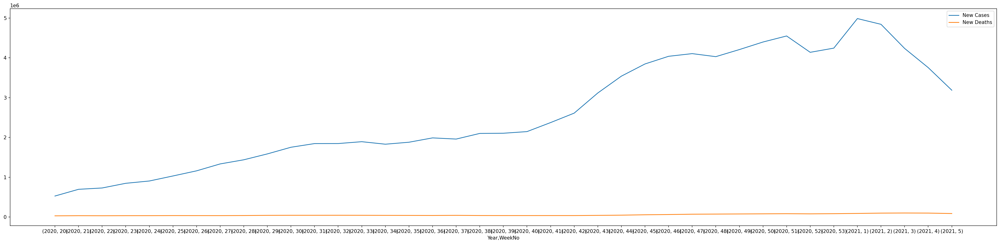

In [44]:
covid_df = pd.read_csv('/content/WHO-COVID-19-global-data.csv')
# covid_df.head()
#Earliest Date 2020-05-12 13:35:10.337000
#Latest Date 2021-02-07 00:56:39.055000
def convert_to_dt(txt):
  return datetime.strptime(txt,'%Y-%m-%d')
covid_df['Date_reported'] = covid_df['Date_reported'].apply(convert_to_dt)
start_date = datetime.strptime('2020-05-12', '%Y-%m-%d')
end_date = datetime.strptime('2021-02-07', '%Y-%m-%d')
mask = (covid_df['Date_reported'] >= start_date) & (covid_df['Date_reported'] <= end_date)
covid_df = covid_df.loc[mask]

covid_df['Year'] = covid_df['Date_reported'].apply(get_year)
covid_df['WeekNo'] = covid_df['Date_reported'].apply(get_weekno)

pivot_covid = pd.pivot_table(data=covid_df[['Year','WeekNo','New_cases','New_deaths']],index = ['Year','WeekNo'],aggfunc=('sum'))
# pivot_covid

pivot_covid.columns.name = None               #remove categories

pivot_covid = pivot_covid.reset_index()                #index to columns

# pivot.plot(figsize=(16,16),kind='line')
# pivot
pivot_covid = pivot_covid.set_index(['Year','WeekNo'])
plt.figure(figsize=(36,8),dpi=150)
pivot_covid['New_cases'].plot(label='New Cases')
pivot_covid['New_deaths'].plot(label='New Deaths')
plt.legend()
x = list(pivot_covid.index.drop_duplicates())
x.sort()
default_x_ticks = range(len(x))
plt.xticks(default_x_ticks, x)

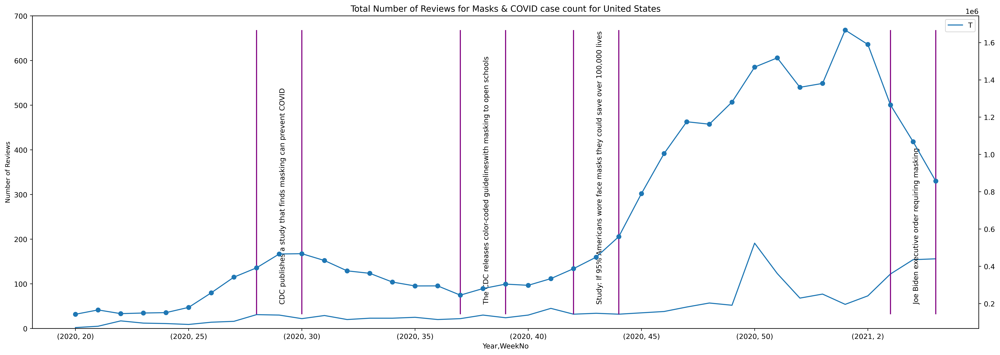

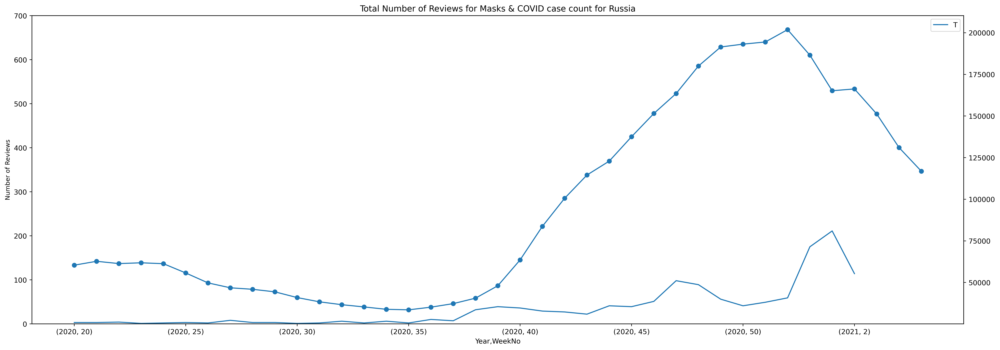

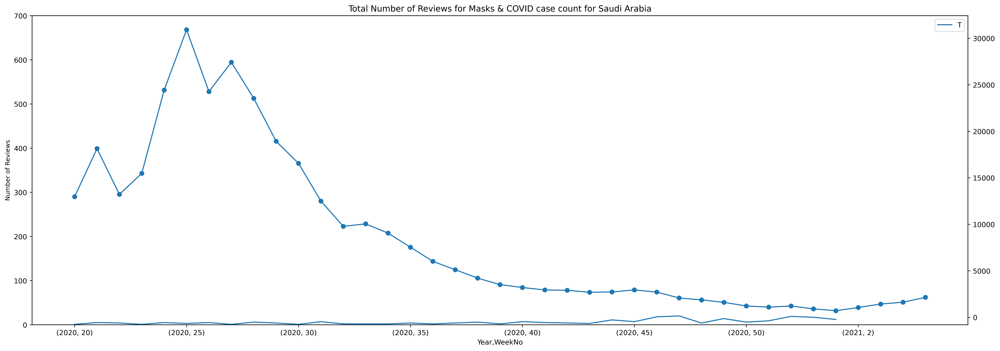

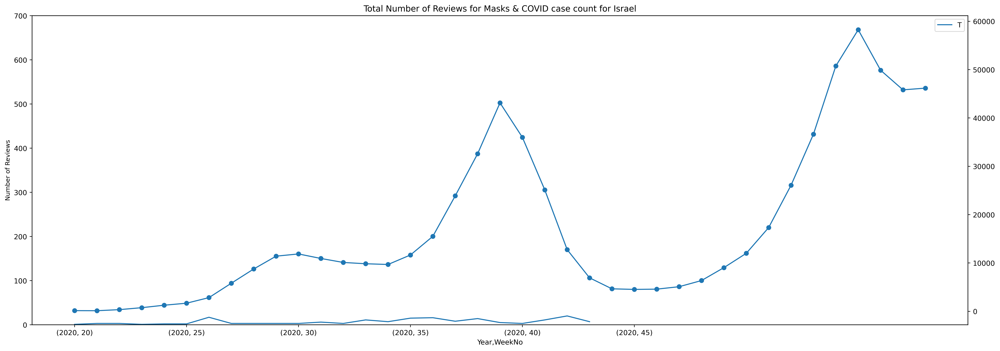

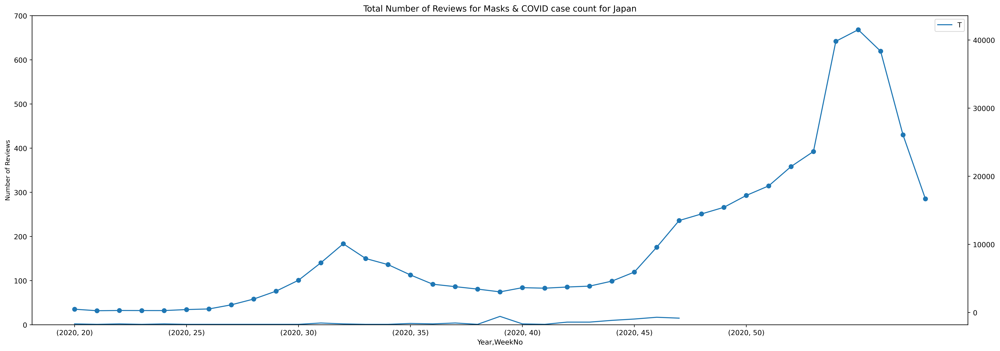

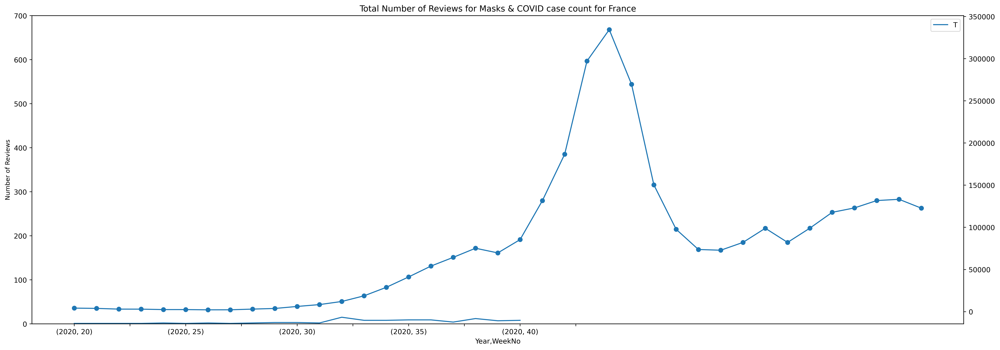

Could not generate for Taiwan


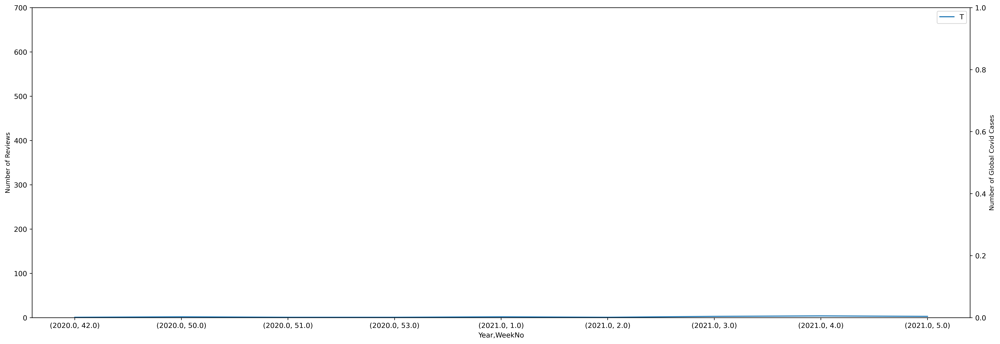

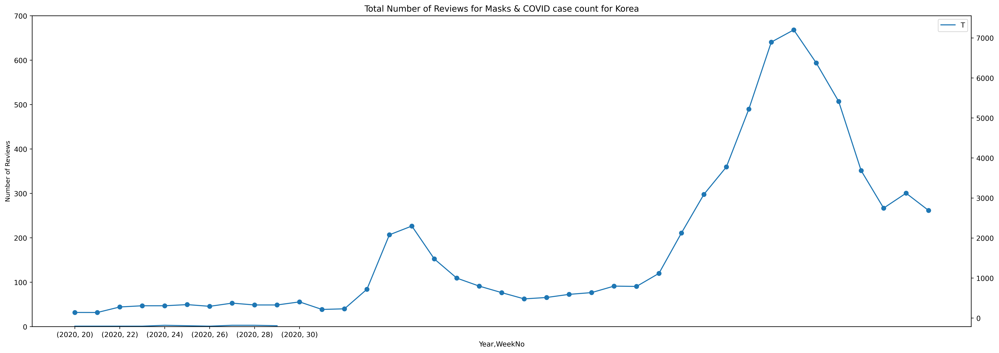

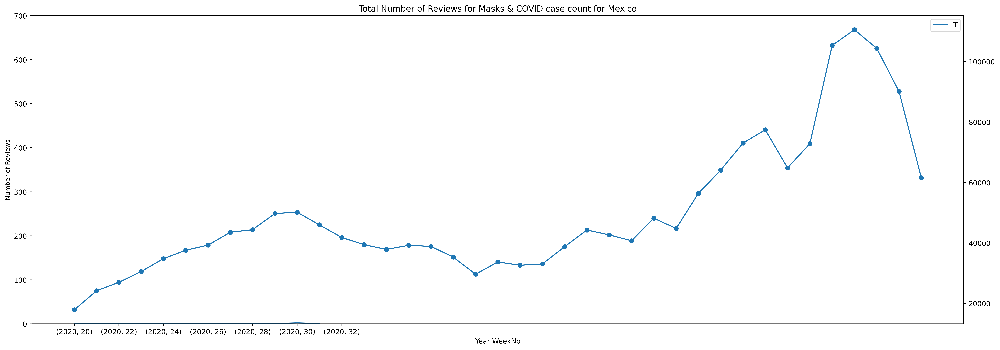

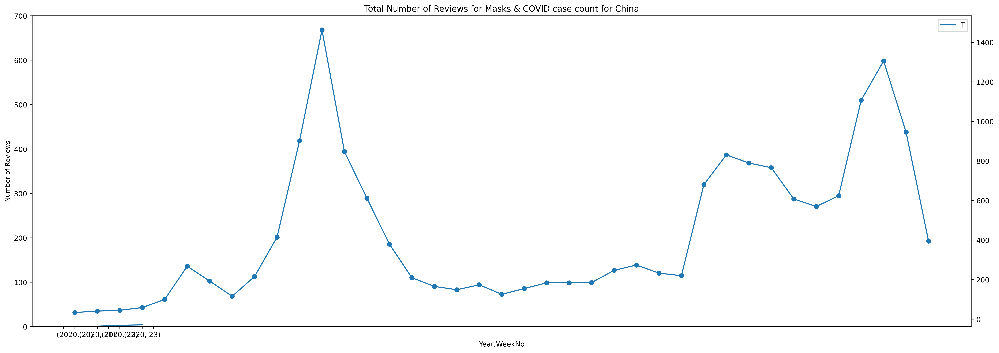

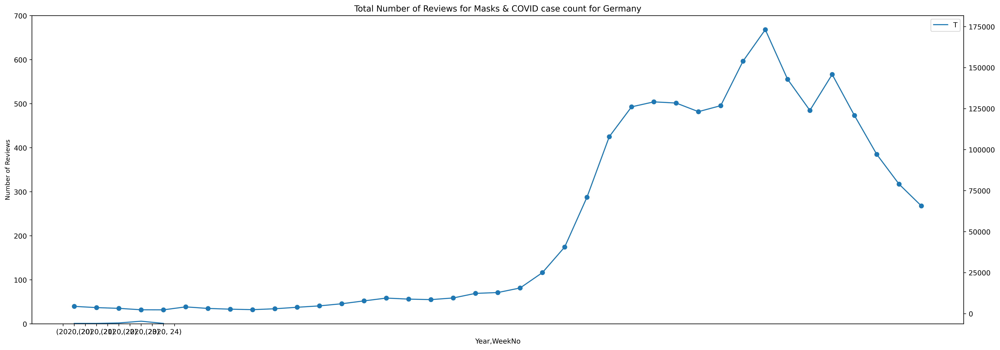

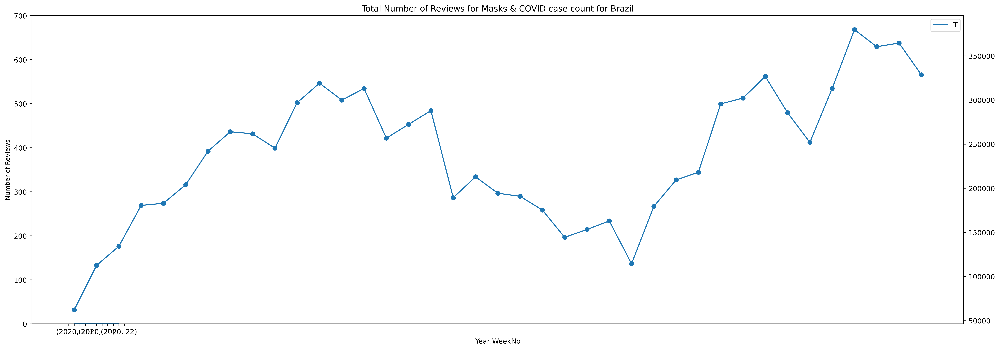

In [49]:
country_list = ['United States','Russia','Saudi Arabia','Israel','Japan','France','Taiwan','Korea','Mexico','China','Germany','Brazil']
country_code_list = ['US','RU','SA','IL','JP','FR','TW','KR','MX','CN','DE','BR']

for i in range(len(country_list)):
  try:
    reviews_df2 = reviews_df.loc[reviews_df['Country']==country_list[i]]
    covid_df2 = covid_df.loc[covid_df['Country_code']==country_code_list[i]]

    pivot_covid = pd.pivot_table(data=covid_df2[['Year','WeekNo','New_cases','New_deaths']],index = ['Year','WeekNo'],aggfunc=('sum'))
    pivot_covid.columns.name = None               #remove categories
    pivot_covid = pivot_covid.reset_index()                #index to columns
    pivot_covid = pivot_covid.set_index(['Year','WeekNo'])

    timeseries_df['Year'] = reviews_df2['DateTime'].apply(get_year)
    timeseries_df['WeekNo'] = reviews_df2['DateTime'].apply(get_weekno)
    timeseries_df['Quantity'] = reviews_df2['productId']
    timeseries_df
    pivot = pd.pivot_table(data=timeseries_df,index = ['Year','WeekNo'],aggfunc='count')

    pivot.columns.name = None               #remove categories

    pivot = pivot.reset_index()                #index to columns

    # pivot.plot(figsize=(16,16),kind='line')
    pivot
    pivot = pivot.set_index(['Year','WeekNo'])



    # plt.figure(figsize=(36,8),dpi=150)
    fig0, ax0 = plt.subplots()
    ax1 = ax0.twinx()
    ax0.set_ylim([0, 700])
    fig0.set_figheight(8)
    fig0.set_figwidth(24)
    fig0.set_dpi(400)
    pivot['Quantity'].plot(label='All Masks',ax=ax0)
    # for label, grp in pivot.groupby('productId'):
    #   if len(grp)>25:
    #     grp['Quantity'].plot(label=label,ax=ax0)
    ax0.legend('TEST',fontsize=10,loc=0)
    # x = list(pivot.index.drop_duplicates())
    # x.sort()
    # default_x_ticks = range(len(x))
    # plt.xticks(default_x_ticks, x)
    if country_code_list[i]=='US':
      plt.vlines(x=8,ymin=0,ymax=20000,colors='purple',label='Lockdown start') 
      plt.vlines(x=10,ymin=0,ymax=20000,colors='purple',label='Lockdown end') 
      plt.text(9,800,'CDC publishes a study that finds masking can prevent COVID',rotation='vertical')
      plt.vlines(x=17,ymin=0,ymax=20000,colors='purple',label='Lockdown start') 
      plt.vlines(x=19,ymin=0,ymax=20000,colors='purple',label='Lockdown end') 
      plt.text(18,800,'The CDC releases color-coded guidelineswith masking to open schools',rotation='vertical')
      plt.vlines(x=22,ymin=0,ymax=20000,colors='purple',label='Lockdown start') 
      plt.vlines(x=24,ymin=0,ymax=20000,colors='purple',label='Lockdown end') 
      plt.text(23,800,'Study: If 95% Americans wore face masks they could save over 100,000 lives',rotation='vertical')
      plt.vlines(x=36,ymin=0,ymax=20000,colors='purple',label='Lockdown start') 
      plt.vlines(x=38,ymin=0,ymax=20000,colors='purple',label='Lockdown end') 
      plt.text(37,800,'Joe Biden executive order requiring masking',rotation='vertical')
        
    ax0.set_ylabel("Number of Reviews",
                  color="black",
                  fontsize=9)
    ax1.set_ylabel("Number of Global Covid Cases",
                  color="black",
                  fontsize=9)
    # ax1.legend(fontsize=10,loc=0)
    # pivot_covid = pivot_covid.set_index(['Year','WeekNo'])
    # plt.figure(figsize=(36,8),dpi=150)
    pivot_covid['New_cases'].plot(label='New Cases', secondary_y=True, ax=ax1, marker="o")
    # pivot_covid['New_deaths'].plot(label='New Deaths')


    # ax2=plt.twinx()
    # # make a plot with different y-axis using second axis object
    # ax2.plot(x, pivot_covid['New_cases'],color="blue",marker="o")
    # ax2.set_ylabel("gdpPercap",color="blue",fontsize=14)

    ax0.set_title("Total Number of Reviews for Masks & COVID case count for "+country_list[i],fontsize=12)
    # plt.legend()
    plt.show()
  except:
    print("Could not generate for "+country_list[i])

In [34]:
country_dict = {'en-US': 'United States', 'ru-RU': 'Russia', 'ar-SA': 'Saudi Arabia', 'he-IL': 'Israel', 'ja-JP': 'Japan', 'fr-FR': 'France', 'zh-TW': 'Taiwan', 'ko-KR': 'Korea', 'es-MX': 'Mexico', 'zh-CN': 'China', 'de-DE': 'Germany', 'pt-BR': 'Brazil'}
def get_country(text):
  return country_dict[text]
reviews_df['Country'] = reviews_df['languageCode'].apply(get_country)
country_df = pd.DataFrame()
mask_time_series = pd.DataFrame()


In [35]:
reviews_df['EnglishReview'] = np.where(reviews_df['languageCode.1']=='en-US', reviews_df['reviewText'], reviews_df['translation.reviewText'])


In [36]:
def remove_stopwords(text,stopwords):
  querywords = text.lower().split()
  resultwords  = [word for word in querywords if word.lower() not in stopwords]
  result = ' '.join(resultwords)
  return result

  # print(result)  
bad_stopwords = ['mask','masks','good','better']
product_id = 101955
filename = str(product_id)+"_bad_reviews.csv"
bad_reviews = reviews_df.loc[(reviews_df['productId']==product_id) & ((reviews_df['ratingValue']==10) | (reviews_df['ratingValue']==20))]['EnglishReview']#.apply(remove_stopwords,stopwords=bad_stopwords)
# bad_reviews.to_csv(filename,index=False)
bad_reviews


2882                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       Boughtit as they were cheap, and thought iHerb doesn't sell masks without quality certificates and that passed tests.\nSearched myself for manufacturer and the mask test. Protection is maximum of 35%. Very disapointed. 
2883                I also was stupid enough to google the mask AFTER purchasing it. Turns out, we shouldn&#39;t be too hasty to trust Iherb to sell only the goods that meet the

Data Cleaning

- "translation.reviewTitle" do translation
- some ReviewText is not translated
- All products are not masks. Some are filters also. 
- Quantities of masks are different (1/50/....). So need to find unit price.
- Get a good sentiment analysis so that distribution of sentiment analysis and of "ratingValue" is similar
- Difference between "languagecode" and "languagecode.1"
- "iHerb Customer" is a Generic customer name
- Types of masks (disposable/washable/filter/certified) - Get it from product name
- How many reviews have images and are they better.
- 'profileInfo.ugcSummary.answerCount' What is it ?
- NaN is not uniform (np.nan and "NaN")

Data Pre-Processing 
- Check Missing Values
- Remove Title,Text,Translation and make one
- Remove foreign languages
- Infer Country from Language Code 

Data Augmentation
- Sentiment Analysis from a good reliable platform (In some lines emoji)
- Get adjectives using Grammarly API
- Get Psychological Profile of Customer from review text
- Get Age/Gender/Family Size of customer from product type and reviewText

Analysis Pointers
- Correlation between imagesCount and hepfulYes (ChiSquared / P value)
- "abuseCount","helpfulYes","helpfulNo","reviewed" - What is the relationship between these parameters
- Anonymous Customers - Which nicknames? From which Country? 
- Popularity and Unit Price




# Data Dictionary for Reviews
 
 - abuseCount (3849 non-null   int64)
 - customerNickname (3849 non-null   object)
 - helpfulNo (3849 non-null   int64)
 - helpfulYes (3849 non-null   int64)
 - id (3849 non-null   object)
 - imagesCount (3849 non-null   int64)
 - **languageCode** (3849 non-null   object)
 - postedDate (3849 non-null   object)
 - productId (3849 non-null   int64) 
 - profileInfo.ugcSummary.answerCount (3843 non-null   float64)
 - profileInfo.ugcSummary.reviewCount (3843 non-null   float64)
 - ratingValue (3849 non-null   int64)
 - **reviewText** (3849 non-null   object)
 - **reviewTitle** (3849 non-null   object)
 - reviewed (3849 non-null   bool)
 - score (3849 non-null   float64)
 - **languageCode.1** (3849 non-null   object)
 - **translation.reviewText** (1994 non-null   object)
 - **translation.reviewTitle** (1994 non-null   object)

In [37]:
reviews_df.loc[reviews_df['abuseCount']>3]

,abuseCount,customerNickname,helpfulNo,helpfulYes,id,imagesCount,languageCode,postedDate,productId,profileInfo.ugcSummary.answerCount,...,reviewTitle,reviewed,score,languageCode.1,translation.reviewText,translation.reviewTitle,product_id,Country,DateTime,EnglishReview
1619,4,iHerb Customer,1,50,1b984b26-b290-4ffb-8e8e-8ed8cbb5dbdd,1,en-US,2020-05-20T17:39:59.67Z,99829,0.0,...,"Fits securely, stylish, should offer some protection against viruses",True,1.609048e+09,en-US,NaN,NaN,99829,United States,2020-05-20 17:39:59.670,"Bought this on a whim as a ""trial"" offer on iHerb for a decent price with not much to go on from the description and the photo of the packaging in Korean. The mask arrives in a package in English, which says it is intended to block dust, pollen, smoke, hair and bacteria -- no mention of the virus droplets we're all concerned about. However, according to the packaging the nano-filter is 0.5μm, while the WHO reports that COVID-19 droplets are 5-10 μm in size, though droplet ""nuclei"" can be smaller. Based on this info, this mask should offer some protection against virus droplets. It's not to N95 standard but should be safe to use in a grocery store and similar situations.\n\nAs for the fit, I'm an average sized adult male with an average sized slightly long face, and the size L fits very securely with some adjustment of the straps and the nose wire. It looks very stylish."


In [38]:
def getGeneration(text):
  lc_text = text.lower().split()
  threeGen = ['grandkids','grandchildren','grandsons','grandson','granddaughter','granddaughters','grand']
  twoGen = ['sons','daughters','son','daughter','kids','children','child']
  material = ['cotton','material','nylon','plastic','synthetic','soft','coarse','fabric']
  forSomeone = ['him','her','my','he','she']
  if any( i in threeGen for i in lc_text):
    return "Three Generation Family - "+text
  elif any( i in twoGen for i in lc_text):
    return "Two Generation Family - "+text
  elif any( i in forSomeone for i in lc_text):
    return "Bought For Someone - "+text
  elif any( i in material for i in lc_text):
    return "Material - "+text
  else:
    return None

reviews_df['EnglishReview'] = np.where(reviews_df['languageCode.1']=='en-US', reviews_df['reviewText'], reviews_df['translation.reviewText'])

for i in reviews_df['EnglishReview']:
  if getGeneration(i)!=None:
    print(getGeneration(i))

Bought For Someone - The mask quality and the color is good. It fits to my face fine. 
Three Generation Family - The grandson really liked it. Comfortable mask.
Material - The Copper fibers in the fabric not only offers sterilization against germs but also gives protection against radiation.
Material - Good mask, comfortable, good air flow. There are no seams at the points of contact with the face and it is very comfortable, there is no feeling of heaviness. On an unshaven face, the mask gradually drops down during conversation or chewing due to the characteristic dynamics of the jaw, the bristles on the face act as a lever in this process. But this phenomenon is also observed when using other masks. The fabric is very soft on the face and does not cause discomfort.
Material - Pleasant and soft fabric. Washes easily and dries very quickly recommends
Material - These masks fit well and are very comfortable. There are many layers of fabric but they are still breathable. I wish they sold 

In [39]:
!pip install ChernoffFace

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [40]:
# from ChernoffFace import *
# import matplotlib.cm

# dfdata = reviews_df[['productId','ratingValue','score']]
# dfdata['productId'] = dfdata['productId'].apply(str)
# dfData2 = variables_rescale(dfdata)
# fig = chernoff_face(data=dfData2,
#                     n_columns=3,
#                     long_face=False,
#                     color_mapper=matplotlib.cm.tab20b,
#                     figsize=(16, 16), dpi=200)
# # fig.tight_layout()
# matplotlib.pyplot.show()

In [41]:
def prodname_tohtml(text):
  temp = text.split(',')
  temp[-1] = '<span style="color:#32893E; font-weight:600;">'+temp[-1]+'</span>'
  txt = ','.join(temp)
  temp = txt.split(',')
  temp[0] = '<span style="color:#742B36; font-weight:600">'+temp[0]+'</span>'
  txt = ','.join(temp)
  ind = 1000
  temp = txt.split()
  disposable = False
  try:
    ind = temp.index('Disposable')
    temp[ind] = '<span style="color:#81CACE; font-weight:600">'+temp[ind]+'</span>'
    txt = ' '.join(temp)
    disposable = True
  except:
    disposable = False
    try:
      ind = temp.index('Reusable')
      temp[ind] = '<span style="color:#21586D; font-weight:600">'+temp[ind]+'</span>'
      txt = ' '.join(temp)
    except:
      try:
        ind = temp.index('Reuseable')
        temp[ind] = '<span style="color:#21586D; font-weight:600">'+temp[ind]+'</span>'
        txt = ' '.join(temp)       
      except: 
        ind = 1000
        txt = ' '.join(temp)
  if disposable == True:
    txt = '<span style="color:#81CACE; font-weight:600"> 🅓 </span>'+ ' - '+txt
  else:
    txt = '<span style="color:#21586D; font-weight:600"> 🅡 </span>'+ ' - '+txt
  txt = '<span style="color: #8F94D8;;font-family: Tahoma, sans-serif;font-size:9pt">'+txt+'</span>'
  return txt

analysis_df2 = analysis_df[['ProductName','Price','reviews_total']]
analysis_df2['ProductName'] = analysis_df2['ProductName'].apply(prodname_tohtml)
analysis_df2['Area'] = analysis_df['Price']*analysis_df['reviews_total']
analysis_df2 = analysis_df2.sort_values('Area',ascending=False)
analysis_df2.to_json(r'/content/chart_json.json',orient='records')
# analysis_df2


<ipython-input-41-6d97dc2beb6d>:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  analysis_df2['ProductName'] = analysis_df2['ProductName'].apply(prodname_tohtml)
<ipython-input-41-6d97dc2beb6d>:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  analysis_df2['Area'] = analysis_df['Price']*analysis_df['reviews_total']


In [42]:
products_df['product_price'].min()

2.95